# K-Means Image Segmentation

## Phase 1 — Import Libraries and Global Configuration

Phase này chuẩn bị môi trường cho toàn bộ notebook: import thư viện, cố định random seed, cấu hình kích thước ảnh, tạo thư mục output và in version để kiểm tra khả năng tái lập kết quả.


In [29]:
try:
    import cv2
except ImportError as exc:
    raise ImportError(
        "opencv-python is required. Install it before running this notebook."
    ) from exc

import os
import time
import json
import warnings
from datetime import datetime
from typing import Tuple
from html import escape

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import json as json_module
from scipy.optimize import linear_sum_assignment

from IPython.display import display, HTML
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.decomposition import PCA
from sklearn.metrics import (
    silhouette_score,
    silhouette_samples,
    davies_bouldin_score,
    calinski_harabasz_score,
)
import joblib
from matplotlib import animation

warnings.filterwarnings("ignore", category=FutureWarning, module="sklearn")
os.environ["OMP_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"
os.environ["OPENBLAS_NUM_THREADS"] = "1"
os.environ["LOKY_MAX_CPU_COUNT"] = "2"

RANDOM_SEED: int = 42
TARGET_SIZE: int = 256
MAX_ITER: int = 300
PIPELINE_START_TIME = time.time()

np.random.seed(RANDOM_SEED)

output_dir = "output_fixed"
os.makedirs(output_dir, exist_ok=True)

plt.rcParams.update({
    "figure.dpi": 100,
    "savefig.dpi": 150,
    "axes.titlesize": 12,
    "axes.labelsize": 10,
    "figure.figsize": (10, 6),
})


def render_phase_table(title: str, rows, columns):
    """Render a compact HTML table for notebook presentation outputs."""
    header_cells = "".join(f"<th>{escape(col)}</th>" for col in columns)
    body_rows = []
    for row in rows:
        cells = "".join(f"<td>{escape(str(value))}</td>" for value in row)
        body_rows.append(f"<tr>{cells}</tr>")

    return f"""
    <div style="display:inline-block; border:2px solid #8bbbd8; font-family:Arial, sans-serif; color:#0f172a; background:#ffffff;">
      <div style="background:#dff1fb; padding:10px 16px; border-bottom:1px solid #b9d8ec;">
        <h2 style="margin:0; font-size:22px; font-weight:800;">{escape(title)}</h2>
      </div>
      <table style="border-collapse:collapse; width:auto; font-size:14px; line-height:1.25;">
        <thead>
          <tr style="background:#0b6288; color:#ffffff; text-align:left;">
            {header_cells}
          </tr>
        </thead>
        <tbody>
          {''.join(body_rows)}
        </tbody>
      </table>
    </div>
    <style>
      td, th {{ border:1px solid #d5e8f8; padding:8px 12px; vertical-align:middle; white-space:nowrap; }}
      td:first-child {{ background:#0b6288; color:#ffffff; font-weight:800; text-align:center; }}
      td:nth-child(2) {{ font-weight:800; }}
      td:nth-child(3) {{ font-family:Menlo, Consolas, monospace; font-weight:700; }}
    </style>
    """



def render_phase_table_wrapped(title: str, rows, columns, max_width: str = "980px"):
    """Render an HTML table that wraps long text instead of creating horizontal scroll."""
    header_cells = "".join(f"<th>{escape(str(col))}</th>" for col in columns)
    body_rows = []
    for row in rows:
        cells = "".join(f"<td>{value}</td>" for value in row)
        body_rows.append(f"<tr>{cells}</tr>")

    return f"""
    <div style="display:inline-block; max-width:{max_width}; border:2px solid #8bbbd8; font-family:Arial, sans-serif; color:#0f172a; background:#ffffff; overflow:visible;">
      <div style="background:#dff1fb; padding:10px 16px; border-bottom:1px solid #b9d8ec;">
        <h2 style="margin:0; font-size:22px; font-weight:800;">{escape(title)}</h2>
      </div>
      <table style="border-collapse:collapse; width:auto; max-width:{max_width}; font-size:13px; line-height:1.25; table-layout:auto;">
        <thead>
          <tr style="background:#0b6288; color:#ffffff; text-align:left;">
            {header_cells}
          </tr>
        </thead>
        <tbody>
          {''.join(body_rows)}
        </tbody>
      </table>
    </div>
    <style>
      td, th {{ border:1px solid #d5e8f8; padding:7px 10px; vertical-align:middle; white-space:normal; overflow-wrap:anywhere; word-break:normal; }}
      td:first-child {{ background:#0b6288; color:#ffffff; font-weight:800; text-align:center; }}
      td:nth-child(2) {{ font-weight:800; }}
      td:nth-child(3) {{ font-family:Menlo, Consolas, monospace; font-weight:700; }}
    </style>
    """

phase1_rows = [
    (0, "Random seed", RANDOM_SEED),
    (1, "Target size", f"{TARGET_SIZE} x {TARGET_SIZE}"),
    (2, "Output folder", f"{output_dir}/"),
    (3, "OpenCV", cv2.__version__),
    (4, "NumPy", np.__version__),
    (5, "pandas", pd.__version__),
    (6, "matplotlib", plt.matplotlib.__version__),
    (7, "scikit-learn", __import__("sklearn").__version__),
    (8, "PIL", Image.__version__),
    (9, "joblib", joblib.__version__),
]

phase1_html = render_phase_table(
    "Phase 1 - Project Setup",
    phase1_rows,
    ["#", "item", "value"],
)
display(HTML(phase1_html))


#,item,value
0,Random seed,42
1,Target size,256 x 256
2,Output folder,output_fixed/
3,OpenCV,4.13.0
4,NumPy,1.26.4
5,pandas,2.3.3
6,matplotlib,3.10.8
7,scikit-learn,1.9.0
8,PIL,12.1.0
9,joblib,1.5.3


## Phase 2 — Load the Image

Phase này nạp ảnh đầu vào từ `../data_image/image-sea2.png`, kiểm tra shape/dtype/pixel range và lưu preview ban đầu để xác nhận ảnh đã đọc đúng trước khi chuyển sang các bước xử lý màu và K-Means.


#,check,value
0,Input path,../data_image/image-liquid.jpg
1,Load status,success
2,Shape,"(3264, 3264, 3)"
3,Data type,uint8
4,Pixel range,0 - 255
5,Total pixels,"10,653,696"
6,Preview output,output_fixed/phase02_loaded_preview.png


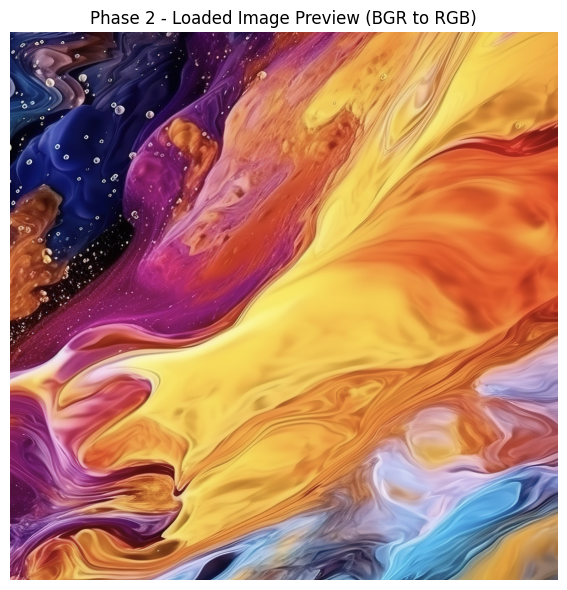

In [30]:
image_path = "../data_image/image-liquid.jpg"

if not os.path.exists(image_path):
    raise FileNotFoundError(
        f"Could not find the input image at '{image_path}'. "
        "Please keep image-liquid.jpg in ../data_image/."
    )

img_bgr = cv2.imread(image_path)

if img_bgr is None:
    raise FileNotFoundError(
        f"Could not read image at '{image_path}'. "
        "Please check that the file exists and is a valid image format."
    )

img_preview = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
preview_path = os.path.join(output_dir, "phase02_loaded_preview.png")

plt.figure(figsize=(8, 6))
plt.imshow(img_preview)
plt.title("Phase 2 - Loaded Image Preview (BGR to RGB)")
plt.axis("off")
plt.tight_layout()
plt.savefig(preview_path, bbox_inches="tight")

phase2_rows = [
    (0, "Input path", image_path),
    (1, "Load status", "success"),
    (2, "Shape", img_bgr.shape),
    (3, "Data type", img_bgr.dtype),
    (4, "Pixel range", f"{img_bgr.min()} - {img_bgr.max()}"),
    (5, "Total pixels", f"{img_bgr.shape[0] * img_bgr.shape[1]:,}"),
    (6, "Preview output", preview_path),
]

phase2_html = render_phase_table(
    "Phase 2 - Load Image",
    phase2_rows,
    ["#", "check", "value"],
)
display(HTML(phase2_html))
plt.show()


## Phase 3 — Convert BGR → RGB and Display the Original

Phase này chuyển ảnh từ định dạng BGR của OpenCV sang RGB để hiển thị đúng màu, sau đó lưu ảnh so sánh BGR/RGB và ảnh gốc RGB dùng làm baseline trực quan.


#,check,value
0,Conversion,BGR to RGB
1,Shape,"(3264, 3264, 3)"
2,Data type,uint8
3,Pixel range,0 - 255
4,Mean R,177.27
5,Mean G,118.06
6,Mean B,92.18
7,Output 1,output_fixed/bgr_vs_rgb.png
8,Output 2,output_fixed/original_image.png


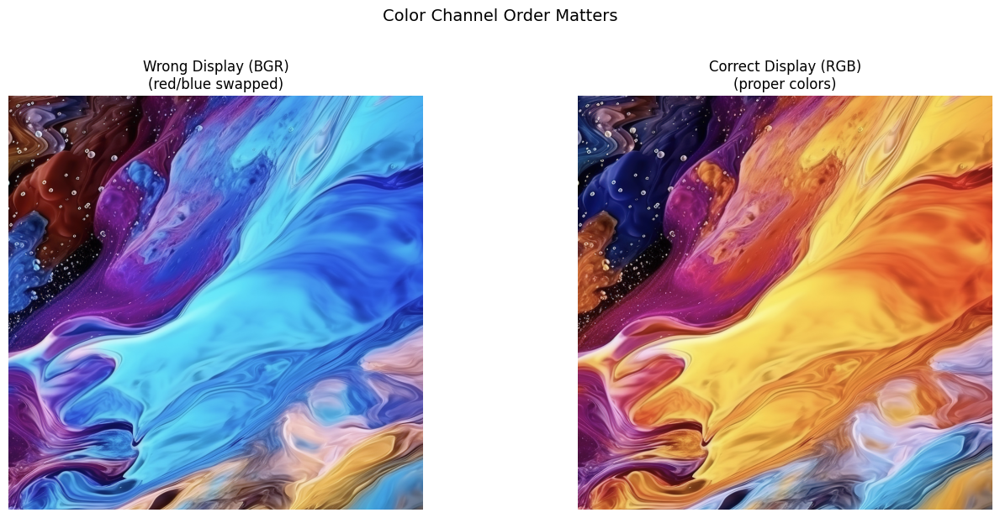

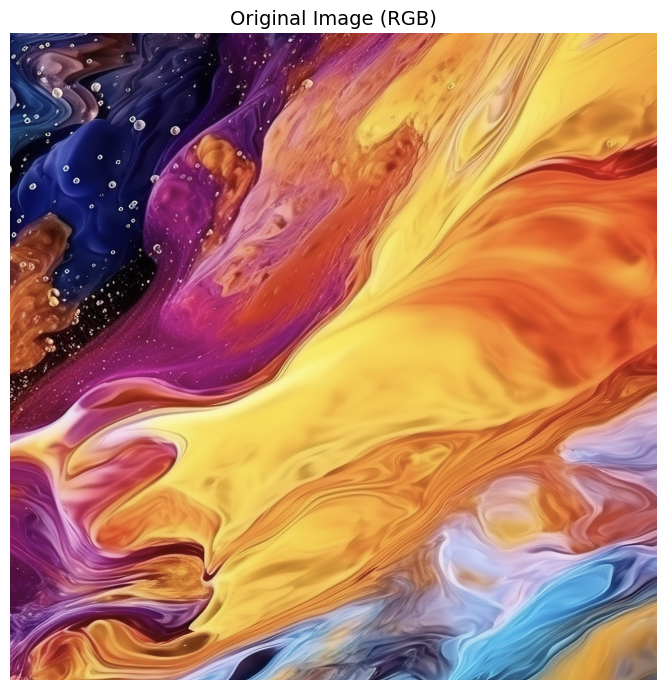

In [31]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

channel_means = img_rgb.mean(axis=(0, 1))
bgr_rgb_path = os.path.join(output_dir, "bgr_vs_rgb.png")
original_rgb_path = os.path.join(output_dir, "original_image.png")

assert img_bgr.shape == img_rgb.shape, "Shape mismatch after color conversion"
assert img_bgr.shape[2] == 3, "Expected a 3-channel image (H, W, 3)"
assert img_rgb.dtype == np.uint8, "Expected uint8 pixel values in [0, 255]"

phase3_rows = [
    (0, "Conversion", "BGR to RGB"),
    (1, "Shape", img_rgb.shape),
    (2, "Data type", img_rgb.dtype),
    (3, "Pixel range", f"{img_rgb.min()} - {img_rgb.max()}"),
    (4, "Mean R", f"{channel_means[0]:.2f}"),
    (5, "Mean G", f"{channel_means[1]:.2f}"),
    (6, "Mean B", f"{channel_means[2]:.2f}"),
    (7, "Output 1", bgr_rgb_path),
    (8, "Output 2", original_rgb_path),
]

phase3_html = render_phase_table(
    "Phase 3 - BGR to RGB Conversion",
    phase3_rows,
    ["#", "check", "value"],
)
display(HTML(phase3_html))

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(img_bgr)
axes[0].set_title("Wrong Display (BGR)\n(red/blue swapped)")
axes[0].axis("off")

axes[1].imshow(img_rgb)
axes[1].set_title("Correct Display (RGB)\n(proper colors)")
axes[1].axis("off")

plt.suptitle("Color Channel Order Matters", fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig(bgr_rgb_path, bbox_inches="tight")
plt.show()

fig, ax = plt.subplots(figsize=(8, 7))
ax.imshow(img_rgb)
ax.set_title("Original Image (RGB)", fontsize=14)
ax.axis("off")
plt.tight_layout()
plt.savefig(original_rgb_path, bbox_inches="tight", dpi=150)
plt.show()


## Phase 4 — Resize the Image for Faster K-Means

Phase này resize ảnh về canvas `256 x 256` để giảm số pixel trước khi chạy K-Means, đồng thời giữ các biến offset/kích thước để các phase sau có thể khôi phục segmentation về kích thước gốc.


#,item,value
0,Original shape,"(3264, 3264, 3)"
1,Resized content,"(256, 256, 3)"
2,Canvas size,"(256, 256, 3)"
3,Interpolation,INTER_AREA
4,Padding offset,"x=0, y=0"
5,Resized pixels,"65,536"
6,Pixel reduction,162.6x
7,Output,output_fixed/resized_image.png


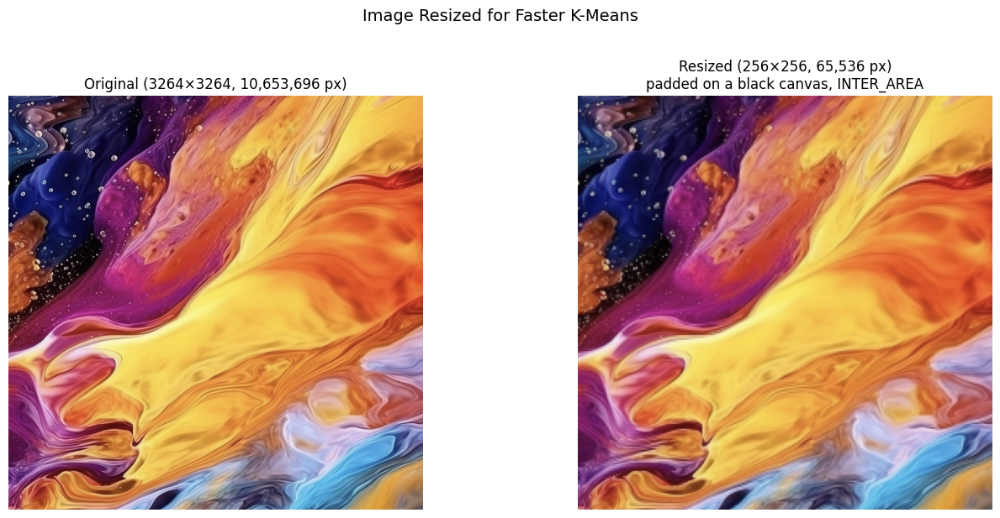

In [32]:
TARGET_SIZE = 256

h, w = img_rgb.shape[:2]
scale = TARGET_SIZE / max(h, w)
new_w = int(round(w * scale))
new_h = int(round(h * scale))

img_resized_content = cv2.resize(
    img_rgb,
    (new_w, new_h),
    interpolation=cv2.INTER_AREA,
)

canvas = np.zeros((TARGET_SIZE, TARGET_SIZE, 3), dtype=np.uint8)
y_off = (TARGET_SIZE - new_h) // 2
x_off = (TARGET_SIZE - new_w) // 2
canvas[y_off:y_off + new_h, x_off:x_off + new_w] = img_resized_content
img_resized = canvas

assert img_resized.shape == (TARGET_SIZE, TARGET_SIZE, 3), "Unexpected resized canvas shape"
assert img_resized.dtype == np.uint8, "Expected uint8 pixel values"

speedup = (h * w) / (TARGET_SIZE * TARGET_SIZE)
resized_path = os.path.join(output_dir, "resized_image.png")

phase4_rows = [
    (0, "Original shape", img_rgb.shape),
    (1, "Resized content", (new_h, new_w, 3)),
    (2, "Canvas size", img_resized.shape),
    (3, "Interpolation", "INTER_AREA"),
    (4, "Padding offset", f"x={x_off}, y={y_off}"),
    (5, "Resized pixels", f"{img_resized.shape[0] * img_resized.shape[1]:,}"),
    (6, "Pixel reduction", f"{speedup:.1f}x"),
    (7, "Output", resized_path),
]

phase4_html = render_phase_table(
    "Phase 4 - Resize Image",
    phase4_rows,
    ["#", "item", "value"],
)
display(HTML(phase4_html))

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(img_rgb)
axes[0].set_title(f"Original ({h}×{w}, {h*w:,} px)")
axes[0].axis("off")

axes[1].imshow(img_resized)
axes[1].set_title(
    f"Resized ({TARGET_SIZE}×{TARGET_SIZE}, {TARGET_SIZE*TARGET_SIZE:,} px)\n"
    "padded on a black canvas, INTER_AREA"
)
axes[1].axis("off")

plt.suptitle("Image Resized for Faster K-Means", fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig(resized_path, bbox_inches="tight")
plt.show()


## Phase 5 — Flatten the Image into a 2D Pixel Feature Matrix

Phase này chuyển ảnh đã resize từ tensor 3 chiều `(H, W, 3)` thành ma trận 2 chiều `(H*W, 3)`. Mỗi dòng là một pixel, ba cột là `R`, `G`, `B`; đây là input trực tiếp cho K-Means.


#,item,value
0,Input image,"(256, 256, 3) uint8"
1,Flatten operation,"(H, W, 3) -> (H*W, 3)"
2,Matrix shape,"(65536, 3)"
3,Matrix columns,"R, G, B"
4,Total bytes,"196,608"
5,Pixel range,"R=3..253, G=2..245, B=2..247"
6,Mean RGB,"R=177.27, G=118.06, B=92.18"
7,Round-trip check,pass
8,Cache output,output_fixed/pixel_matrix_cache.npz
9,Visualization output,output_fixed/flattened_pixel_matrix.png


pixel_index,y,x,R,G,B
0,0,0,25,37,89
1,0,1,37,47,101
2,0,2,47,56,108
256,1,0,16,24,73
32768,128,0,179,86,41
65535,255,255,91,90,99


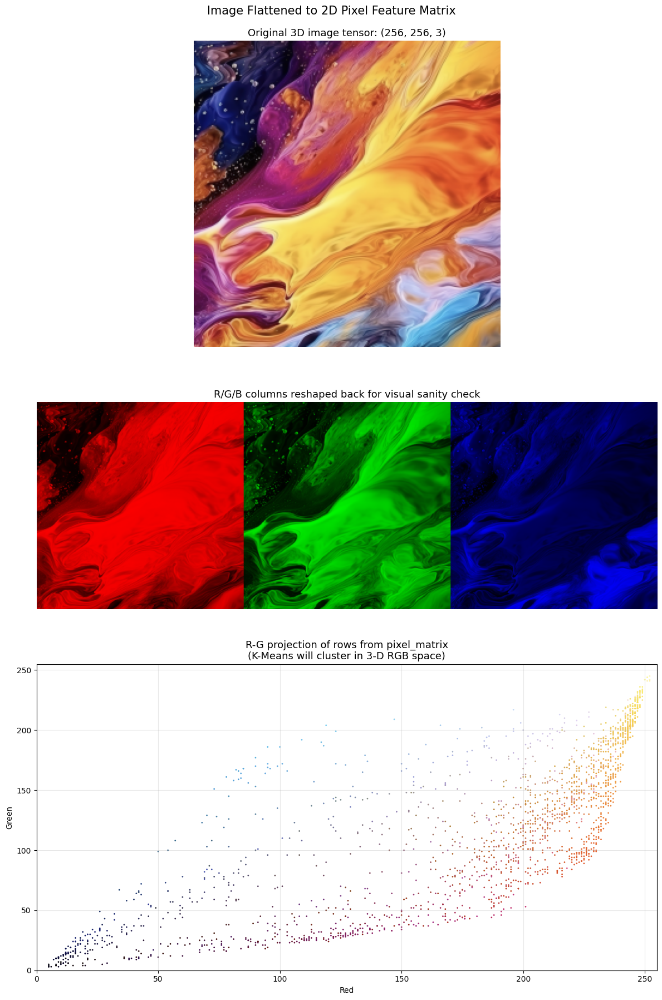

In [33]:
t_flatten_start = time.time()

N_PIXELS = img_resized.shape[0] * img_resized.shape[1]
H_RESIZED, W_RESIZED = img_resized.shape[:2]

pixel_matrix = img_resized.reshape(N_PIXELS, 3)

assert pixel_matrix.shape == (N_PIXELS, 3), f"Expected ({N_PIXELS}, 3), got {pixel_matrix.shape}"
assert pixel_matrix.dtype == np.uint8, "Dtype changed after reshape"
assert pixel_matrix.size == N_PIXELS * 3, "Element count mismatch"

reconstructed = pixel_matrix.reshape(H_RESIZED, W_RESIZED, 3)
assert np.array_equal(reconstructed, img_resized), "Round-trip reshape changed pixel values"

channel_min = pixel_matrix.min(axis=0)
channel_mean = pixel_matrix.mean(axis=0)
channel_max = pixel_matrix.max(axis=0)

flattened_visual_path = os.path.join(output_dir, "flattened_pixel_matrix.png")
cache_path = os.path.join(output_dir, "pixel_matrix_cache.npz")

phase5_summary_rows = [
    (0, "Input image", f"{img_resized.shape} {img_resized.dtype}"),
    (1, "Flatten operation", "(H, W, 3) -> (H*W, 3)"),
    (2, "Matrix shape", pixel_matrix.shape),
    (3, "Matrix columns", "R, G, B"),
    (4, "Total bytes", f"{pixel_matrix.nbytes:,}"),
    (5, "Pixel range", f"R={channel_min[0]}..{channel_max[0]}, G={channel_min[1]}..{channel_max[1]}, B={channel_min[2]}..{channel_max[2]}"),
    (6, "Mean RGB", f"R={channel_mean[0]:.2f}, G={channel_mean[1]:.2f}, B={channel_mean[2]:.2f}"),
    (7, "Round-trip check", "pass"),
    (8, "Cache output", cache_path),
    (9, "Visualization output", flattened_visual_path),
]

phase5_summary_html = render_phase_table(
    "Phase 5 - Flatten to 2D Pixel Feature Matrix",
    phase5_summary_rows,
    ["#", "item", "value"],
)
display(HTML(phase5_summary_html))

preview_indices = [
    0,
    1,
    2,
    W_RESIZED,
    N_PIXELS // 2,
    N_PIXELS - 1,
]

matrix_preview_rows = []
for idx in preview_indices:
    y = idx // W_RESIZED
    x = idx % W_RESIZED
    r, g, b = [int(v) for v in pixel_matrix[idx]]
    assert np.array_equal(pixel_matrix[idx], img_resized[y, x]), f"Mismatch at pixel index {idx}"
    matrix_preview_rows.append((idx, y, x, r, g, b))

matrix_preview_html = render_phase_table(
    "2D Matrix Preview",
    matrix_preview_rows,
    ["pixel_index", "y", "x", "R", "G", "B"],
)
display(HTML(matrix_preview_html))

fig, axes = plt.subplots(3, 1, figsize=(12, 18))

axes[0].imshow(img_resized)
axes[0].set_title(f"Original 3D image tensor: {img_resized.shape}", fontsize=13)
axes[0].axis("off")

r_chan = pixel_matrix[:, 0].reshape(H_RESIZED, W_RESIZED)
g_chan = pixel_matrix[:, 1].reshape(H_RESIZED, W_RESIZED)
b_chan = pixel_matrix[:, 2].reshape(H_RESIZED, W_RESIZED)

rgb_strip = np.concatenate([
    np.stack([r_chan, np.zeros_like(r_chan), np.zeros_like(r_chan)], axis=-1),
    np.stack([np.zeros_like(g_chan), g_chan, np.zeros_like(g_chan)], axis=-1),
    np.stack([np.zeros_like(b_chan), np.zeros_like(b_chan), b_chan], axis=-1)
], axis=1)

axes[1].imshow(rgb_strip)
axes[1].set_title("R/G/B columns reshaped back for visual sanity check", fontsize=13)
axes[1].axis("off")

sample_idx = np.random.RandomState(RANDOM_SEED).choice(N_PIXELS, size=2000, replace=False)
sample_pixels = pixel_matrix[sample_idx]

axes[2].scatter(
    sample_pixels[:, 0],
    sample_pixels[:, 1],
    c=sample_pixels / 255.0,
    s=4,
    edgecolors="none"
)
axes[2].set_xlabel("Red")
axes[2].set_ylabel("Green")
axes[2].set_title("R-G projection of rows from pixel_matrix\n(K-Means will cluster in 3-D RGB space)", fontsize=13)
axes[2].set_xlim(0, 255)
axes[2].set_ylim(0, 255)
axes[2].grid(True, alpha=0.3)

plt.suptitle("Image Flattened to 2D Pixel Feature Matrix", fontsize=15, y=0.995)
plt.tight_layout()
plt.savefig(flattened_visual_path, bbox_inches="tight")
plt.show()

np.savez_compressed(
    cache_path,
    pixel_matrix=pixel_matrix,
    n_pixels=np.array([N_PIXELS], dtype=np.int64),
    h_resized=np.array([H_RESIZED], dtype=np.int64),
    w_resized=np.array([W_RESIZED], dtype=np.int64)
)

t_flatten = time.time() - t_flatten_start


## Phase 6 — Baseline K-Means Clustering

Phase này chạy mô hình K-Means baseline với `K=5` trên `pixel_matrix`. Mục tiêu là tạo kết quả phân đoạn ban đầu, kiểm tra labels/centroids và trực quan hóa cách các pixel được gán vào các centroid màu.


#,item,value
0,Input matrix,"(65536, 3)"
1,K clusters,4
2,n_init,3
3,max_iter,300
4,Fit wall-time,242.7 ms
5,Iterations,35
6,Inertia,"156,339,664.00"
7,Labels shape,"(65536,)"
8,Centroids shape,"(4, 3)"
9,Segmented image,"(256, 256, 3)"


cluster,color,R,G,B,pixels,image %
0,,71,34,73,"14,579",22.2%
1,,196,97,70,"21,944",33.5%
2,,169,158,187,"8,246",12.6%
3,,234,183,90,"20,767",31.7%


#,check,value
0,Labels shape,pass
1,Centroids dtype,uint8
2,Label range,"[0, 3]"
3,Centroid value range,34..234
4,Reconstruction,pass
5,Cache output,output_fixed/kmeans_model_cache.npz
6,Visualization output,output_fixed/kmeans_segmentation.png


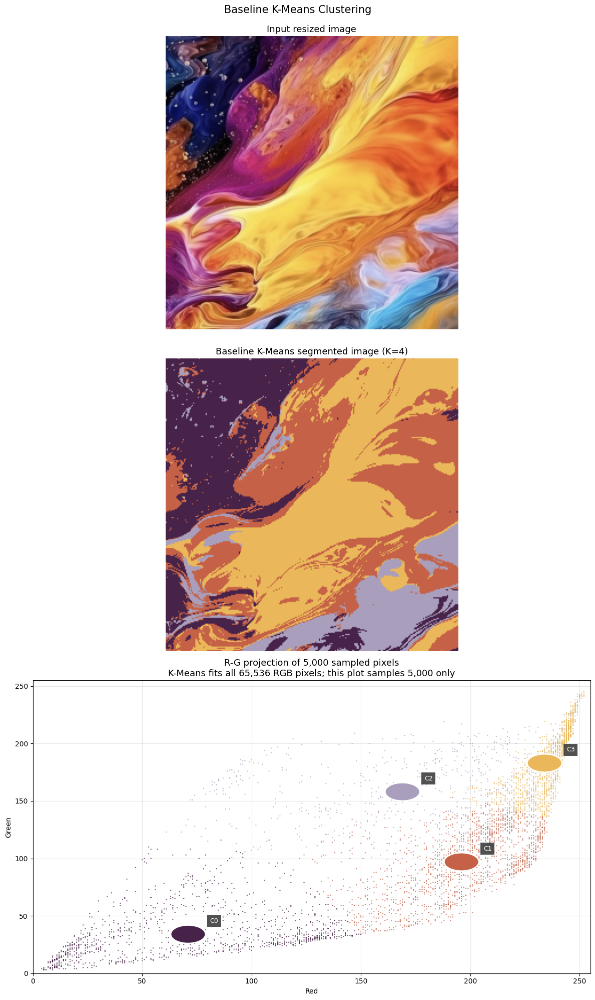

In [34]:
os.environ["OMP_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"
os.environ["OPENBLAS_NUM_THREADS"] = "1"
os.environ["LOKY_MAX_CPU_COUNT"] = "2"

warnings.filterwarnings("ignore", category=FutureWarning, module="sklearn")

t_kmeans_start = time.time()

K_CLUSTERS: int = 4
N_INIT: int = 3
MAX_ITER: int = 300

t_fit_start = time.time()

kmeans = KMeans(
    n_clusters=K_CLUSTERS,
    n_init=N_INIT,
    max_iter=MAX_ITER,
    random_state=RANDOM_SEED,
    algorithm="lloyd",
)
kmeans.fit(pixel_matrix.astype(np.float32))

t_fit = time.time() - t_fit_start

labels = kmeans.labels_
centroids = kmeans.cluster_centers_.astype(np.uint8)
inertia = kmeans.inertia_

assert labels.shape == (N_PIXELS,), f"labels shape mismatch: {labels.shape}"
assert centroids.shape == (K_CLUSTERS, 3), f"centroids shape mismatch: {centroids.shape}"
assert centroids.dtype == np.uint8, f"centroids dtype changed: {centroids.dtype}"
assert labels.min() >= 0 and labels.max() <= K_CLUSTERS - 1, f"label range error: {labels.min()}..{labels.max()}"
assert np.all(centroids >= 0) and np.all(centroids <= 255), "centroid value out of [0,255]"

t_recon_start = time.time()
img_segmented = centroids[labels].reshape(H_RESIZED, W_RESIZED, 3)
t_recon = time.time() - t_recon_start

assert img_segmented.shape == (H_RESIZED, W_RESIZED, 3), f"segmented shape mismatch: {img_segmented.shape}"
assert img_segmented.dtype == np.uint8, f"segmented dtype: {img_segmented.dtype}"

segmentation_path = os.path.join(output_dir, "kmeans_segmentation.png")
model_cache_path = os.path.join(output_dir, "kmeans_model_cache.npz")

phase6_result_rows = [
    (0, "Input matrix", pixel_matrix.shape),
    (1, "K clusters", K_CLUSTERS),
    (2, "n_init", N_INIT),
    (3, "max_iter", MAX_ITER),
    (4, "Fit wall-time", f"{t_fit*1000:.1f} ms"),
    (5, "Iterations", int(kmeans.n_iter_)),
    (6, "Inertia", f"{inertia:,.2f}"),
    (7, "Labels shape", labels.shape),
    (8, "Centroids shape", centroids.shape),
    (9, "Segmented image", img_segmented.shape),
]

phase6_result_html = render_phase_table(
    "Phase 6 - Baseline K-Means Result",
    phase6_result_rows,
    ["#", "item", "value"],
)
display(HTML(phase6_result_html))

cluster_rows = []
for i, c in enumerate(centroids):
    count = int(np.sum(labels == i))
    pct = count / N_PIXELS * 100
    hex_colour = f"#{int(c[0]):02x}{int(c[1]):02x}{int(c[2]):02x}"
    cluster_rows.append((i, hex_colour, int(c[0]), int(c[1]), int(c[2]), f"{count:,}", f"{pct:.1f}%"))

cluster_body = []
for cluster_id, hex_colour, r, g, b, count, pct in cluster_rows:
    cluster_body.append(
        f"""
        <tr>
          <td>{cluster_id}</td>
          <td><span style="display:inline-block; width:52px; height:24px; border:1px solid #cbd5e1; background:{hex_colour}; vertical-align:middle;"></span></td>
          <td>{r}</td>
          <td>{g}</td>
          <td>{b}</td>
          <td>{count}</td>
          <td>{pct}</td>
        </tr>
        """
    )

cluster_html = f"""
<div style="display:inline-block; border:2px solid #8bbbd8; font-family:Arial, sans-serif; color:#0f172a; background:#ffffff;">
  <div style="background:#dff1fb; padding:10px 16px; border-bottom:1px solid #b9d8ec;">
    <h2 style="margin:0; font-size:22px; font-weight:800;">Baseline Cluster Centroids</h2>
  </div>
  <table style="border-collapse:collapse; width:auto; font-size:14px; line-height:1.25;">
    <thead>
      <tr style="background:#0b6288; color:#ffffff; text-align:left;">
        <th>cluster</th><th>color</th><th>R</th><th>G</th><th>B</th><th>pixels</th><th>image %</th>
      </tr>
    </thead>
    <tbody>{''.join(cluster_body)}</tbody>
  </table>
</div>
<style>
  td, th {{ border:1px solid #d5e8f8; padding:8px 12px; vertical-align:middle; white-space:nowrap; }}
  td:first-child {{ background:#0b6288; color:#ffffff; font-weight:800; text-align:center; }}
  td:nth-child(3), td:nth-child(4), td:nth-child(5) {{ font-weight:800; }}
</style>
"""
display(HTML(cluster_html))

check_rows = [
    (0, "Labels shape", "pass"),
    (1, "Centroids dtype", str(centroids.dtype)),
    (2, "Label range", f"[{labels.min()}, {labels.max()}]"),
    (3, "Centroid value range", f"{centroids.min()}..{centroids.max()}"),
    (4, "Reconstruction", "pass"),
    (5, "Cache output", model_cache_path),
    (6, "Visualization output", segmentation_path),
]

check_html = render_phase_table(
    "Baseline Sanity Checks",
    check_rows,
    ["#", "check", "value"],
)
display(HTML(check_html))

t_plot_start = time.time()

fig, axes = plt.subplots(3, 1, figsize=(12, 20))

axes[0].imshow(img_resized)
axes[0].set_title("Input resized image", fontsize=13)
axes[0].axis("off")

axes[1].imshow(img_segmented)
axes[1].set_title(f"Baseline K-Means segmented image (K={K_CLUSTERS})", fontsize=13)
axes[1].axis("off")

sample_idx = np.random.RandomState(RANDOM_SEED).choice(N_PIXELS, size=5000, replace=False)
sample_labels = labels[sample_idx]
sample_colours = centroids[sample_labels] / 255.0
sample_pixels_for_plot = pixel_matrix[sample_idx]

ax_s = axes[2]
ax_s.scatter(
    sample_pixels_for_plot[:, 0],
    sample_pixels_for_plot[:, 1],
    c=sample_colours,
    s=3,
    edgecolors="none",
    alpha=0.7,
)

for i, c in enumerate(centroids):
    ax_s.add_patch(
        plt.Circle(
            (c[0], c[1]),
            8,
            color=c / 255.0,
            ec="white",
            lw=2,
            zorder=10,
        )
    )
    ax_s.text(
        c[0] + 10,
        c[1] + 10,
        f"C{i}",
        fontsize=9,
        color="white",
        bbox=dict(facecolor="#333", alpha=0.85, edgecolor="none"),
    )

ax_s.set_xlabel("Red")
ax_s.set_ylabel("Green")
ax_s.set_title(
    f"R-G projection of 5,000 sampled pixels\n"
    f"K-Means fits all {N_PIXELS:,} RGB pixels; this plot samples 5,000 only",
    fontsize=13,
)
ax_s.set_xlim(0, 255)
ax_s.set_ylim(0, 255)
ax_s.grid(True, alpha=0.3)

plt.suptitle("Baseline K-Means Clustering", fontsize=15, y=0.995)
plt.tight_layout()
plt.savefig(segmentation_path, bbox_inches="tight")
plt.show()

t_plot = time.time() - t_plot_start

np.savez_compressed(
    model_cache_path,
    labels=labels,
    centroids=centroids,
    img_segmented=img_segmented,
    inertia=np.array([inertia], dtype=np.float64),
    k_clusters=np.array([K_CLUSTERS], dtype=np.int64),
)

t_kmeans = time.time() - t_kmeans_start


## Phase 7 — Find the Optimal K with Elbow Method

Phase này chạy K-Means với nhiều giá trị `K` để quan sát inertia giảm như thế nào. Elbow Method chọn điểm cân bằng: thêm cluster sau điểm này vẫn giảm inertia nhưng lợi ích giảm dần.


#,item,value
0,K range,2..12
1,n_init,3
2,Selector,KneeLocator
3,Curve,convex / decreasing
4,best Elbow selected K,5
5,Source,kneed.KneeLocator
6,Inertia at selected K,"121,024,536"
7,Total fit time,3840.9 ms
8,Cache output,output_fixed/elbow_cache.npz
9,Visualization output,output_fixed/elbow_method.png


K,inertia,delta to next K,iterations,fit time ms
2,"334,191,328","101,191,184",10,104.7
3,"233,000,144","76,660,480",8,136.0
4,"156,339,664","35,315,128",35,246.3
5,"121,024,536","16,179,528",7,181.3
6,"104,845,008","14,121,528",38,328.5
7,"90,723,480","12,100,336",19,710.2
8,"78,623,144","8,158,256",29,405.8
9,"70,464,888","6,038,776",22,311.8
10,"64,426,112","5,555,992",19,389.1
11,"58,870,120","4,778,880",14,555.7


#,check,value
0,Inertia length,pass
1,Inertia monotonic,pass
2,Optimal K in range,pass
3,best Elbow selected K,5
4,Cache saved,pending


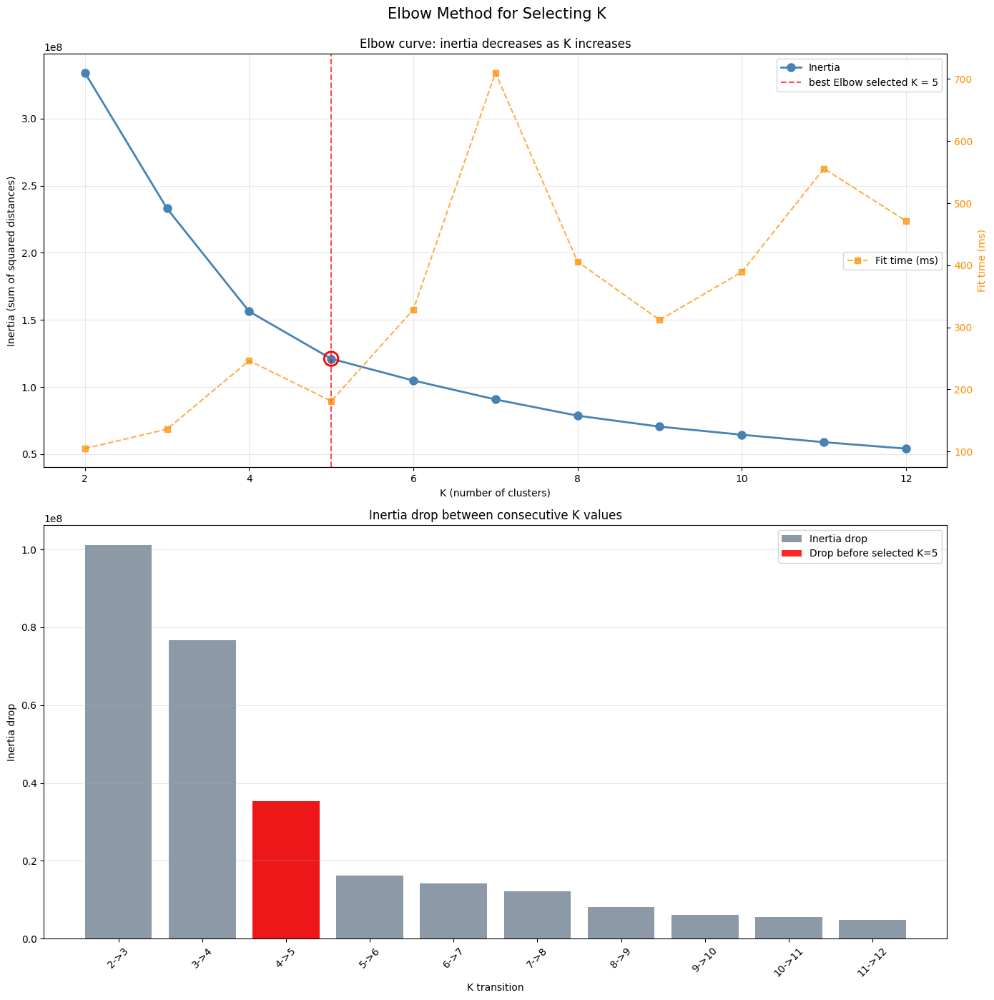

/var/folders/bv/v6xrr89n7qq0tsldx0_96vkh0000gn/T/ipykernel_60201/4029703908.py:290: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])
/var/folders/bv/v6xrr89n7qq0tsldx0_96vkh0000gn/T/ipykernel_60201/4029703908.py:315: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


#,item,value
0,K range,2..12
1,Purpose,visualize segmentation changes as K increases
2,GIF output,output_fixed/k_evolution.gif
3,Grid output,output_fixed/k_evolution_grid.png
4,Generation time,17.50 s


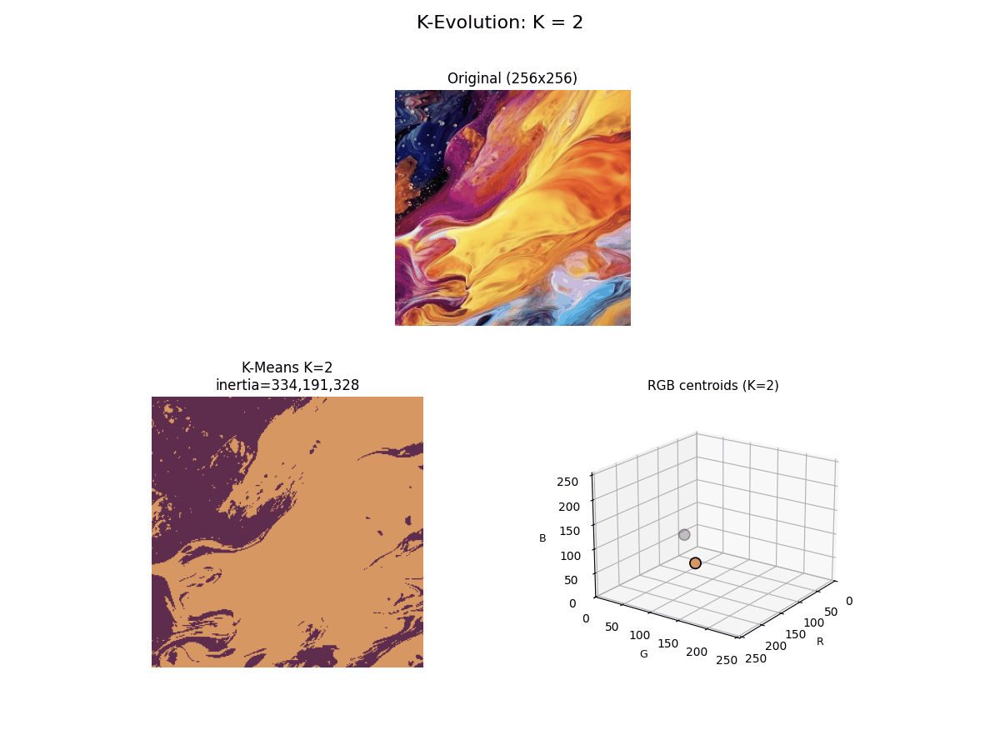

In [35]:
t_elbow_start = time.time()

try:
    from kneed import KneeLocator
except ImportError as exc:
    raise ImportError(
        "kneed is required. Install it before running this notebook."
    ) from exc

K_MIN: int = 2
K_MAX: int = 12
N_INIT_SEARCH: int = 3

pixel_matrix_f32 = pixel_matrix.astype(np.float32)

k_range = np.arange(K_MIN, K_MAX + 1, dtype=np.int64)
n_k = len(k_range)

inertias = np.zeros(n_k, dtype=np.float64)
n_iters = np.zeros(n_k, dtype=np.int64)
fit_times = np.zeros(n_k, dtype=np.float64)

for i, k in enumerate(k_range):
    t0 = time.time()

    kmeans_i = KMeans(
        n_clusters=int(k),
        n_init=N_INIT_SEARCH,
        max_iter=MAX_ITER,
        random_state=RANDOM_SEED,
        algorithm="lloyd",
    )
    kmeans_i.fit(pixel_matrix_f32)

    fit_times[i] = time.time() - t0
    inertias[i] = kmeans_i.inertia_
    n_iters[i] = kmeans_i.n_iter_

deltas = inertias[:-1] - inertias[1:]

knee_locator = KneeLocator(
    k_range.tolist(),
    inertias.tolist(),
    curve="convex",
    direction="decreasing",
)

if knee_locator.elbow is None:
    second_drops = deltas[:-1] - deltas[1:]
    fallback_idx = int(np.argmax(second_drops) + 1)
    optimal_k_source = "fallback_largest_second_order_drop"
    optimal_k = int(k_range[fallback_idx])
else:
    optimal_k_source = "kneed.KneeLocator"
    optimal_k = int(knee_locator.elbow)

optimal_idx = int(np.where(k_range == optimal_k)[0][0])

assert len(k_range) == n_k
assert len(inertias) == n_k
assert np.all(np.diff(inertias) <= 0), "Inertia should monotonically decrease with K"
assert optimal_k >= K_MIN and optimal_k <= K_MAX, "optimal_k out of range"

elbow_path = os.path.join(output_dir, "elbow_method.png")
elbow_cache_path = os.path.join(output_dir, "elbow_cache.npz")

phase7_result_rows = [
    (0, "K range", f"{K_MIN}..{K_MAX}"),
    (1, "n_init", N_INIT_SEARCH),
    (2, "Selector", "KneeLocator"),
    (3, "Curve", "convex / decreasing"),
    (4, "best Elbow selected K", optimal_k),
    (5, "Source", optimal_k_source),
    (6, "Inertia at selected K", f"{inertias[optimal_idx]:,.0f}"),
    (7, "Total fit time", f"{fit_times.sum()*1000:.1f} ms"),
    (8, "Cache output", elbow_cache_path),
    (9, "Visualization output", elbow_path),
]

phase7_result_html = render_phase_table(
    "Phase 7 - Elbow Method Result",
    phase7_result_rows,
    ["#", "item", "value"],
)
display(HTML(phase7_result_html))

k_search_rows = []
for i, k in enumerate(k_range):
    delta_to_next = "-" if i == len(k_range) - 1 else f"{deltas[i]:,.0f}"
    k_search_rows.append(
        (
            int(k),
            f"{inertias[i]:,.0f}",
            delta_to_next,
            int(n_iters[i]),
            f"{fit_times[i]*1000:.1f}",
        )
    )

k_search_html = render_phase_table(
    "K Search Result",
    k_search_rows,
    ["K", "inertia", "delta to next K", "iterations", "fit time ms"],
)
display(HTML(k_search_html))

check_rows = [
    (0, "Inertia length", "pass"),
    (1, "Inertia monotonic", "pass"),
    (2, "Optimal K in range", "pass"),
    (3, "best Elbow selected K", optimal_k),
    (4, "Cache saved", "pending"),
]

check_html = render_phase_table(
    "Elbow Sanity Checks",
    check_rows,
    ["#", "check", "value"],
)
display(HTML(check_html))

fig, axes = plt.subplots(2, 1, figsize=(14, 14))

axes[0].plot(
    k_range,
    inertias,
    "o-",
    color="steelblue",
    linewidth=2,
    markersize=8,
    label="Inertia",
)
axes[0].axvline(
    optimal_k,
    color="red",
    linestyle="--",
    alpha=0.7,
    label=f"best Elbow selected K = {optimal_k}",
)
axes[0].scatter(
    [optimal_k],
    [inertias[optimal_idx]],
    color="red",
    s=200,
    zorder=5,
    facecolors="none",
    edgecolors="red",
    linewidth=2,
)
axes[0].set_xlabel("K (number of clusters)")
axes[0].set_ylabel("Inertia (sum of squared distances)")
axes[0].set_title("Elbow curve: inertia decreases as K increases")
axes[0].grid(True, alpha=0.3)
axes[0].legend(loc="upper right")

ax2 = axes[0].twinx()
ax2.plot(
    k_range,
    fit_times * 1000,
    "s--",
    color="darkorange",
    linewidth=1.5,
    markersize=6,
    alpha=0.7,
    label="Fit time (ms)",
)
ax2.set_ylabel("Fit time (ms)", color="darkorange")
ax2.tick_params(axis="y", labelcolor="darkorange")
ax2.legend(loc="center right")

axes[1].bar(
    [f"{int(k_range[i])}->{int(k_range[i+1])}" for i in range(len(deltas))],
    deltas,
    color="slategray",
    alpha=0.8,
    label="Inertia drop",
)
if optimal_idx > 0:
    axes[1].bar(
        [f"{int(k_range[optimal_idx - 1])}->{optimal_k}"],
        [deltas[optimal_idx - 1]],
        color="red",
        alpha=0.85,
        label=f"Drop before selected K={optimal_k}",
    )
axes[1].set_xlabel("K transition")
axes[1].set_ylabel("Inertia drop")
axes[1].set_title("Inertia drop between consecutive K values")
axes[1].tick_params(axis="x", rotation=45)
axes[1].grid(True, axis="y", alpha=0.3)
axes[1].legend()

plt.suptitle("Elbow Method for Selecting K", fontsize=15, y=0.995)
plt.tight_layout()
plt.savefig(elbow_path, bbox_inches="tight")
plt.show()

np.savez_compressed(
    elbow_cache_path,
    k_range=k_range,
    inertias=inertias,
    deltas=deltas,
    fit_times=fit_times,
    n_iters=n_iters,
    kneed_elbow=np.array([-1 if knee_locator.elbow is None else int(knee_locator.elbow)], dtype=np.int64),
    optimal_k=np.array([optimal_k], dtype=np.int64),
)

# K-evolution preview moved from the former Phase 14 into Phase 7.
# Save GIF/grid here, but only display the GIF in notebook output.
from IPython.display import Image as IPImage

k_evolution_start = time.time()
k_evolution_gif_path = os.path.join(output_dir, "k_evolution.gif")
k_evolution_grid_path = os.path.join(output_dir, "k_evolution_grid.png")
k_evolution_json_path = os.path.join(output_dir, "k_evolution_animation.json")

k_animate = [int(k) for k in k_range]
frames_data = []
for k in k_animate:
    km_k = KMeans(
        n_clusters=k,
        n_init=N_INIT_SEARCH,
        max_iter=MAX_ITER,
        random_state=RANDOM_SEED,
        algorithm="lloyd",
    )
    km_k.fit(pixel_matrix_f32)
    centers_k = np.clip(km_k.cluster_centers_, 0, 255).astype(np.uint8)
    seg_k = centers_k[km_k.labels_].reshape(H_RESIZED, W_RESIZED, 3)
    frames_data.append({
        "k": k,
        "inertia": float(km_k.inertia_),
        "centroids": km_k.cluster_centers_.copy(),
        "segmentation": seg_k,
    })

assert len(frames_data) == len(k_animate), "K-evolution frame count mismatch"

ANIMATION_TOTAL_DURATION_S = 10
FPS = len(frames_data) / ANIMATION_TOTAL_DURATION_S
DURATION_PER_FRAME_MS = int(round(1000 / FPS))
total_duration_ms = len(frames_data) * DURATION_PER_FRAME_MS


def figure_to_rgb(fig):
    fig.canvas.draw()
    rgba_buf = fig.canvas.buffer_rgba()
    w_fig, h_fig = fig.canvas.get_width_height()
    frame_rgba = np.asarray(rgba_buf).reshape(h_fig, w_fig, 4)
    return frame_rgba[:, :, :3].copy()


def plot_rgb_centroids(ax3d, centroids_k, k, title):
    ax3d.scatter(
        centroids_k[:, 0], centroids_k[:, 1], centroids_k[:, 2],
        c=np.clip(centroids_k / 255.0, 0.0, 1.0),
        s=90, edgecolors="black", linewidth=1.2,
    )
    ax3d.set_xlim(0, 255)
    ax3d.set_ylim(0, 255)
    ax3d.set_zlim(0, 255)
    ax3d.set_xlabel("R", fontsize=9)
    ax3d.set_ylabel("G", fontsize=9)
    ax3d.set_zlabel("B", fontsize=9)
    ax3d.set_title(title, fontsize=11)
    ax3d.view_init(elev=20, azim=35)
    ax3d.grid(True, alpha=0.3)


def render_gif_frame(fd):
    k = fd["k"]
    fig = plt.figure(figsize=(12, 9))
    gs = fig.add_gridspec(2, 2, height_ratios=[1.0, 1.15], width_ratios=[1.0, 1.15], hspace=0.28, wspace=0.22)

    ax0 = fig.add_subplot(gs[0, :])
    ax0.imshow(img_resized)
    ax0.set_title(f"Original ({H_RESIZED}x{W_RESIZED})", fontsize=12)
    ax0.axis("off")

    ax1 = fig.add_subplot(gs[1, 0])
    ax1.imshow(fd["segmentation"])
    ax1.set_title(f"K-Means K={k}\ninertia={fd['inertia']:,.0f}", fontsize=12)
    ax1.axis("off")

    ax3d = fig.add_subplot(gs[1, 1], projection="3d")
    plot_rgb_centroids(ax3d, fd["centroids"], k, f"RGB centroids (K={k})")

    fig.suptitle(f"K-Evolution: K = {k}", fontsize=16, y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.94])
    frame_rgb = figure_to_rgb(fig)
    plt.close(fig)
    return frame_rgb


def render_grid_frame(fd):
    k = fd["k"]
    fig = plt.figure(figsize=(16, 6))
    gs = fig.add_gridspec(1, 3, width_ratios=[1.0, 1.0, 1.15], wspace=0.25)

    ax0 = fig.add_subplot(gs[0, 0])
    ax0.imshow(img_resized)
    ax0.set_title(f"Original ({H_RESIZED}x{W_RESIZED})", fontsize=11)
    ax0.axis("off")

    ax1 = fig.add_subplot(gs[0, 1])
    ax1.imshow(fd["segmentation"])
    ax1.set_title(f"K-Means K={k}\ninertia={fd['inertia']:,.0f}", fontsize=11)
    ax1.axis("off")

    ax3d = fig.add_subplot(gs[0, 2], projection="3d")
    plot_rgb_centroids(ax3d, fd["centroids"], k, f"RGB centroids (K={k})")

    fig.suptitle(f"K-Evolution: K = {k}", fontsize=15, y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.94])
    frame_rgb = figure_to_rgb(fig)
    plt.close(fig)
    return frame_rgb


gif_frame_arrays = [render_gif_frame(fd) for fd in frames_data]
grid_frame_arrays = [render_grid_frame(fd) for fd in frames_data]

assert len(gif_frame_arrays) == len(k_animate)
assert len(grid_frame_arrays) == len(k_animate)

gif_frames = [Image.fromarray(frame) for frame in gif_frame_arrays]
gif_frames[0].save(
    k_evolution_gif_path,
    save_all=True,
    append_images=gif_frames[1:],
    duration=DURATION_PER_FRAME_MS,
    loop=0,
)

fig_grid, axes_grid = plt.subplots(len(grid_frame_arrays), 1, figsize=(16, 5.2 * len(grid_frame_arrays)))
axes_grid = np.atleast_1d(axes_grid).reshape(len(grid_frame_arrays))
for ax_grid, fd, frame in zip(axes_grid, frames_data, grid_frame_arrays):
    ax_grid.imshow(frame)
    ax_grid.set_title(f"K={fd['k']} | inertia={fd['inertia']:,.0f}", fontsize=12)
    ax_grid.axis("off")
plt.suptitle(
    f"K-Evolution: {len(grid_frame_arrays)} frames, GIF duration ~ {total_duration_ms/1000:.1f} s",
    fontsize=16, y=0.998,
)
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.savefig(k_evolution_grid_path, bbox_inches="tight")
plt.close(fig_grid)

gif_size = os.path.getsize(k_evolution_gif_path)
grid_size = os.path.getsize(k_evolution_grid_path)
assert gif_size > 1000, "GIF too small"
assert grid_size > 1000, "Grid image too small"

k_evolution_results = {
    "k_range": k_animate,
    "fps": FPS,
    "duration_ms_per_frame": DURATION_PER_FRAME_MS,
    "total_duration_s": total_duration_ms / 1000,
    "gif_frame_shape": list(gif_frame_arrays[0].shape),
    "grid_frame_shape": list(grid_frame_arrays[0].shape),
    "gif_path": k_evolution_gif_path,
    "gif_size_bytes": gif_size,
    "grid_path": k_evolution_grid_path,
    "grid_size_bytes": grid_size,
    "inertias": [float(fd["inertia"]) for fd in frames_data],
    "generated_in_phase": 7,
    "tested_at": datetime.now().isoformat(timespec="seconds"),
}
with open(k_evolution_json_path, "w") as f:
    json_module.dump(k_evolution_results, f, indent=2)

phase7_animation_rows = [
    (0, "K range", f"{min(k_animate)}..{max(k_animate)}"),
    (1, "Purpose", "visualize segmentation changes as K increases"),
    (2, "GIF output", k_evolution_gif_path),
    (3, "Grid output", k_evolution_grid_path),
    (4, "Generation time", f"{(time.time() - k_evolution_start):.2f} s"),
]
phase7_animation_html = render_phase_table_wrapped(
    "K-Evolution Preview",
    phase7_animation_rows,
    ["#", "item", "value"],
    max_width="820px",
)
display(HTML(phase7_animation_html))

display(IPImage(filename=k_evolution_gif_path))

t_elbow = time.time() - t_elbow_start


## Phase 8 — Final Pipeline: Re-fit with Optimal K and Save Model

Phase này huấn luyện lại K-Means với `optimal_k` từ Phase 7, tái tạo ảnh segmentation cuối cùng, khôi phục segmentation về kích thước ảnh gốc và lưu model bằng `joblib` để có thể load lại cho inference.


#,item,value
0,K_FINAL,5
1,Source,optimal_k from Phase 7
2,n_init,10
3,Fit wall-time,651.3 ms
4,Iterations,7
5,Inertia,"121,024,536.00"
6,Labels shape,"(65536,)"
7,Centroids shape,"(5, 3)"
8,Segmented image,"(256, 256, 3)"
9,Model output,output_fixed/kmeans_segmentation.joblib


cluster,R,G,B,pixels,image %
0,208,112,66,"19,912",30.4%
1,135,56,90,"11,513",17.6%
2,236,189,93,"17,840",27.2%
3,171,161,189,"7,782",11.9%
4,39,25,62,"8,489",13.0%


#,check,value
0,labels_final shape,pass
1,centroids_final shape,pass
2,img_segmented_final shape,pass
3,label_map shape,pass
4,joblib round-trip,pass
5,final_pipeline.png,saved
6,original-size segmentation,saved
7,cluster_distribution.png,saved
8,label_map.png,saved


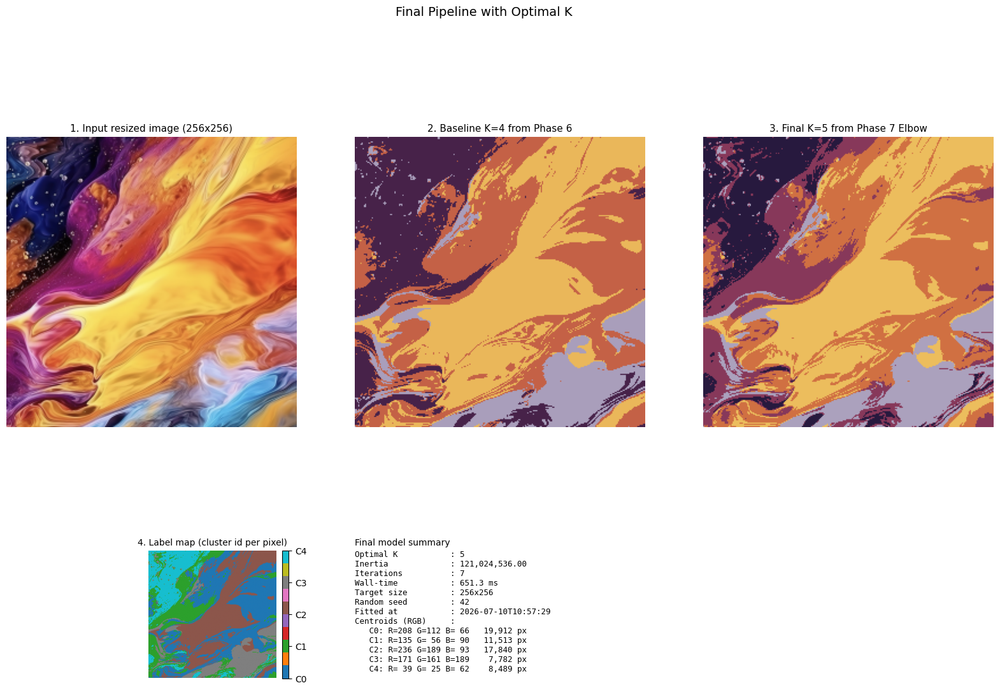

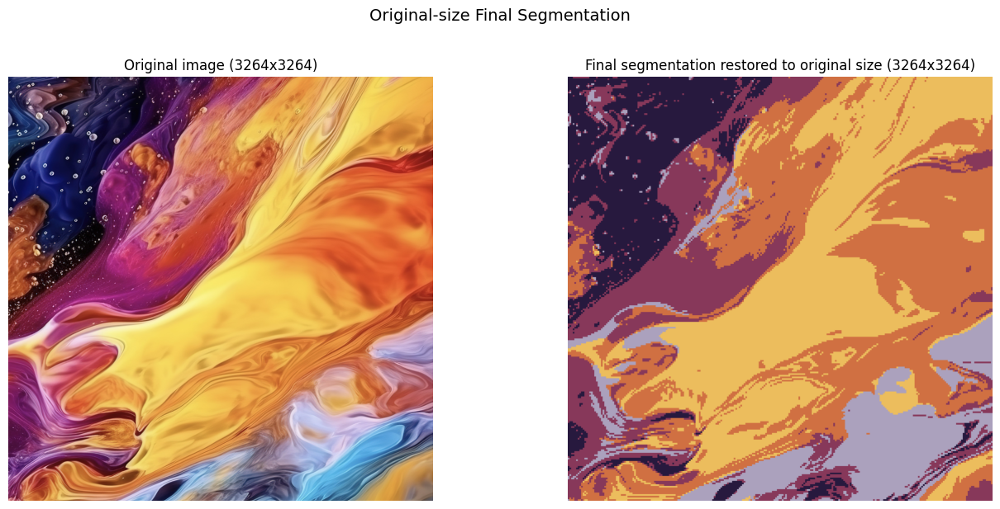

In [36]:
t_final_pipeline_start = time.time()

K_FINAL: int = int(optimal_k)
N_INIT_FINAL: int = 10

t0 = time.time()
kmeans_final = KMeans(
    n_clusters=K_FINAL,
    n_init=N_INIT_FINAL,
    max_iter=MAX_ITER,
    random_state=RANDOM_SEED,
    algorithm="lloyd",
)
kmeans_final.fit(pixel_matrix_f32)
t_fit = time.time() - t0

labels_final = kmeans_final.labels_
centroids_final = kmeans_final.cluster_centers_.astype(np.uint8)
inertia_final = kmeans_final.inertia_
n_iter_final = kmeans_final.n_iter_

img_segmented_final = centroids_final[labels_final].reshape(H_RESIZED, W_RESIZED, 3)

# Crop the resized content region before restoring to original size.
# If the resized image filled the full 256x256 canvas, this crop is the full canvas.
segmented_content = img_segmented_final[
    y_off:y_off + new_h,
    x_off:x_off + new_w,
]

img_segmented_original_size = cv2.resize(
    segmented_content,
    (w, h),
    interpolation=cv2.INTER_NEAREST,
)

assert img_segmented_original_size.shape == img_rgb.shape, (
    f"original-size segmentation shape mismatch: "
    f"{img_segmented_original_size.shape} vs {img_rgb.shape}"
)

final_original_size_path = os.path.join(output_dir, "final_segmentation_original_size.png")
cv2.imwrite(
    final_original_size_path,
    cv2.cvtColor(img_segmented_original_size, cv2.COLOR_RGB2BGR),
)

assert img_segmented_final.shape == img_resized.shape, f"Shape mismatch: {img_segmented_final.shape} vs {img_resized.shape}"
assert img_segmented_final.dtype == np.uint8, "dtype regression"
assert labels_final.shape == (N_PIXELS,)
assert centroids_final.shape == (K_FINAL, 3)

label_map = labels_final.reshape(H_RESIZED, W_RESIZED)

model_artifact = {
    "kmeans": kmeans_final,
    "optimal_k": K_FINAL,
    "centroids": centroids_final,
    "target_size": TARGET_SIZE,
    "random_seed": RANDOM_SEED,
    "fitted_at": datetime.now().isoformat(timespec="seconds"),
    "inertia": float(inertia_final),
    "n_iter": int(n_iter_final),
    "model_source": "final_pipeline",
}

model_path = os.path.join(output_dir, "kmeans_segmentation.joblib")
joblib.dump(model_artifact, model_path, compress=3)

loaded = joblib.load(model_path)
assert loaded["optimal_k"] == K_FINAL
assert np.array_equal(loaded["centroids"], centroids_final)
assert loaded["target_size"] == TARGET_SIZE

final_pipeline_path = os.path.join(output_dir, "final_pipeline.png")
final_original_size_compare_path = os.path.join(
    output_dir,
    "final_segmentation_original_size_comparison.png",
)
cluster_distribution_path = os.path.join(output_dir, "cluster_distribution.png")
label_png_path = os.path.join(output_dir, "label_map.png")

phase8_result_rows = [
    (0, "K_FINAL", K_FINAL),
    (1, "Source", "optimal_k from Phase 7"),
    (2, "n_init", N_INIT_FINAL),
    (3, "Fit wall-time", f"{t_fit*1000:.1f} ms"),
    (4, "Iterations", int(n_iter_final)),
    (5, "Inertia", f"{inertia_final:,.2f}"),
    (6, "Labels shape", labels_final.shape),
    (7, "Centroids shape", centroids_final.shape),
    (8, "Segmented image", img_segmented_final.shape),
    (9, "Model output", model_path),
]

phase8_result_html = render_phase_table(
    "Phase 8 - Final Model Result",
    phase8_result_rows,
    ["#", "item", "value"],
)
display(HTML(phase8_result_html))

cluster_rows = []
for i, c in enumerate(centroids_final):
    count = int(np.sum(labels_final == i))
    pct = count / N_PIXELS * 100
    cluster_rows.append((i, int(c[0]), int(c[1]), int(c[2]), f"{count:,}", f"{pct:.1f}%"))

cluster_html = render_phase_table(
    "Final Cluster Centroids",
    cluster_rows,
    ["cluster", "R", "G", "B", "pixels", "image %"],
)

fig_cluster, ax_cluster = plt.subplots(figsize=(12, 4))
bar_colors = centroids_final / 255.0
counts = np.array([np.sum(labels_final == i) for i in range(K_FINAL)])
bars = ax_cluster.bar(range(K_FINAL), counts, color=bar_colors, edgecolor="black", linewidth=0.5)
for bar, i in zip(bars, range(K_FINAL)):
    pct = counts[i] / N_PIXELS * 100
    ax_cluster.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 200,
        f"{counts[i]:,}\n({pct:.1f}%)",
        ha="center",
        va="bottom",
        fontsize=9,
    )
ax_cluster.set_xticks(range(K_FINAL))
ax_cluster.set_xticklabels([f"C{i}\n{tuple(int(v) for v in centroids_final[i])}" for i in range(K_FINAL)])
ax_cluster.set_xlabel("Cluster")
ax_cluster.set_ylabel("Pixel count")
ax_cluster.set_title(f"Cluster size distribution (K={K_FINAL})")
ax_cluster.grid(True, alpha=0.3, axis="y")
plt.tight_layout()
plt.savefig(cluster_distribution_path, bbox_inches="tight")
plt.close(fig_cluster)

cluster_distribution_panel = f"""
<div style="display:flex; align-items:flex-start; gap:22px; flex-wrap:nowrap; max-width:1260px;">
  <div style="flex:0 0 auto;">{cluster_html}</div>
  <div style="flex:1 1 auto; min-width:620px; padding-top:0;">
    <img src="{cluster_distribution_path}" style="width:100%; max-width:820px; height:auto; border:0; display:block;"/>
  </div>
</div>
"""
display(HTML(cluster_distribution_panel))
check_rows = [
    (0, "labels_final shape", "pass"),
    (1, "centroids_final shape", "pass"),
    (2, "img_segmented_final shape", "pass"),
    (3, "label_map shape", "pass"),
    (4, "joblib round-trip", "pass"),
    (5, "final_pipeline.png", "saved"),
    (6, "original-size segmentation", "saved"),
    (7, "cluster_distribution.png", "saved"),
    (8, "label_map.png", "saved"),
]

check_html = render_phase_table(
    "Final Pipeline Checks and Artifacts",
    check_rows,
    ["#", "check", "value"],
)
display(HTML(check_html))

fig = plt.figure(figsize=(20, 12))
gs = fig.add_gridspec(2, 3, height_ratios=[3, 1], hspace=0.3, wspace=0.2)

ax_orig = fig.add_subplot(gs[0, 0])
ax_orig.imshow(img_resized)
ax_orig.set_title(f"1. Input resized image ({TARGET_SIZE}x{TARGET_SIZE})", fontsize=11)
ax_orig.axis("off")

ax_base = fig.add_subplot(gs[0, 1])
ax_base.imshow(img_segmented)
ax_base.set_title(f"2. Baseline K={K_CLUSTERS} from Phase 6", fontsize=11)
ax_base.axis("off")

ax_final = fig.add_subplot(gs[0, 2])
ax_final.imshow(img_segmented_final)
ax_final.set_title(f"3. Final K={K_FINAL} from Phase 7 Elbow", fontsize=11)
ax_final.axis("off")

ax_label = fig.add_subplot(gs[1, 0])
im = ax_label.imshow(label_map, cmap="tab10", vmin=0, vmax=K_FINAL - 1)
ax_label.set_title("4. Label map (cluster id per pixel)", fontsize=10)
ax_label.axis("off")
cbar = plt.colorbar(im, ax=ax_label, fraction=0.05, pad=0.02)
cbar.set_ticks(range(K_FINAL))
cbar.set_ticklabels([f"C{i}" for i in range(K_FINAL)])

ax_legend = fig.add_subplot(gs[1, 1:])
ax_legend.axis("off")
ax_legend.set_title("Final model summary", fontsize=10, loc="left")
summary_lines = [
    f"Optimal K           : {K_FINAL}",
    f"Inertia             : {inertia_final:,.2f}",
    f"Iterations          : {int(n_iter_final)}",
    f"Wall-time           : {t_fit*1000:.1f} ms",
    f"Target size         : {TARGET_SIZE}x{TARGET_SIZE}",
    f"Random seed         : {RANDOM_SEED}",
    f"Fitted at           : {model_artifact['fitted_at']}",
    "Centroids (RGB)     :",
]
for i, c in enumerate(centroids_final):
    count = int(np.sum(labels_final == i))
    summary_lines.append(f"   C{i}: R={c[0]:3d} G={c[1]:3d} B={c[2]:3d}   {count:6,} px")
ax_legend.text(
    0.0,
    1.0,
    "\n".join(summary_lines),
    family="monospace",
    fontsize=9,
    va="top",
    ha="left",
    transform=ax_legend.transAxes,
)

plt.suptitle("Final Pipeline with Optimal K", fontsize=14, y=0.99)
plt.savefig(final_pipeline_path, bbox_inches="tight")
plt.show()

fig_restore, ax_restore = plt.subplots(1, 2, figsize=(14, 6))
ax_restore[0].imshow(img_rgb)
ax_restore[0].set_title(f"Original image ({h}x{w})")
ax_restore[0].axis("off")
ax_restore[1].imshow(img_segmented_original_size)
ax_restore[1].set_title(f"Final segmentation restored to original size ({h}x{w})")
ax_restore[1].axis("off")
plt.suptitle("Original-size Final Segmentation", fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig(final_original_size_compare_path, bbox_inches="tight")
plt.show()

cv2.imwrite(label_png_path, (label_map * (255 // max(K_FINAL - 1, 1))).astype(np.uint8))

t_final_pipeline_step = time.time() - t_final_pipeline_start
total_pipeline = time.time() - PIPELINE_START_TIME


## Phase 9 — Cluster Interpretation and Inference Sanity Check

Phase này diễn giải các cluster cuối cùng bằng centroid/mean/std RGB, kiểm tra model `joblib` load lại có tái tạo đúng segmentation không, và trực quan hóa boundary để thấy ranh giới giữa các vùng cluster.


cluster,color label,centroid RGB,mean RGB,std RGB,pixels,image %
0,orange-brown,"(208, 112, 66)","(208.7, 112.1, 66.8)","(16.8, 24.0, 22.5)","19,912",30.4%
1,magenta-red,"(135, 56, 90)","(135.9, 56.9, 90.4)","(29.9, 25.0, 32.7)","11,513",17.6%
2,yellow-orange,"(236, 189, 93)","(236.6, 189.3, 93.1)","(9.4, 22.7, 20.5)","17,840",27.2%
3,lavender,"(171, 161, 189)","(171.7, 161.7, 189.9)","(45.6, 28.7, 31.1)","7,782",11.9%
4,dark-purple,"(39, 25, 62)","(40.0, 25.3, 62.5)","(26.2, 17.0, 29.2)","8,489",13.0%


#,check,value
0,Model path,output_fixed/kmeans_segmentation.joblib
1,Loaded optimal K,5
2,Metadata match,pass
3,Reloaded labels shape,"(65536,)"
4,Label match,100.0000%
5,Segmentation match,pass
6,Deterministic prediction,pass
7,Prediction wall-time,3.07 ms


cluster,label,avg_std,purity
0,orange-brown,21.1,83.50%
1,magenta-red,29.2,77.17%
2,yellow-orange,17.5,86.30%
3,lavender,35.2,72.53%
4,dark-purple,24.1,81.14%


#,item,value
0,Boundary pixels,"19,305"
1,Boundary share,29.46%
2,All clusters non-empty,pass
3,Cluster stats output,output_fixed/cluster_stats.json
4,Boundary visualization,output_fixed/cluster_boundaries.png


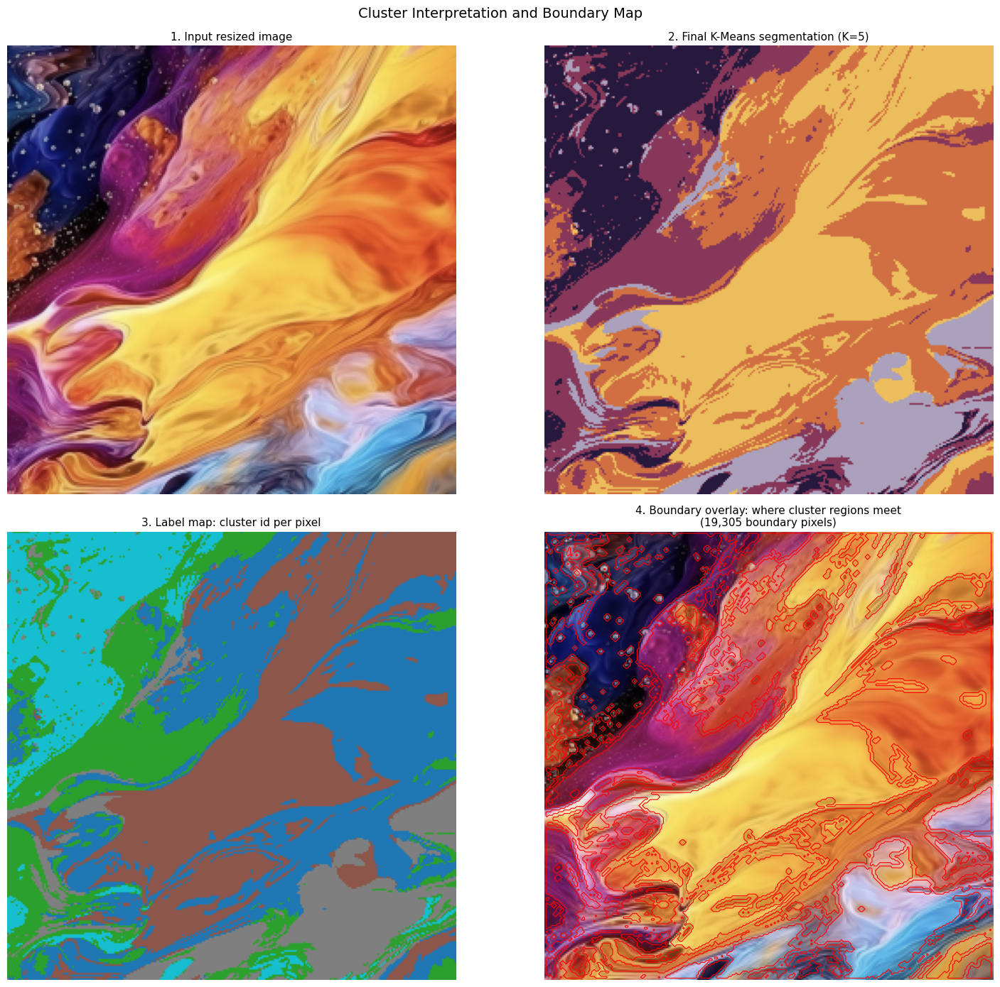

In [37]:
t_cluster_analysis_start = time.time()


def classify_color(rgb: np.ndarray) -> str:
    r, g, b = int(rgb[0]), int(rgb[1]), int(rgb[2])
    if r >= 220 and g >= 165 and b < 130:
        return "yellow-orange"
    if r >= 180 and 80 <= g < 150 and b < 110:
        return "orange-brown"
    if r >= 110 and g < 90 and 70 <= b <= 130:
        return "magenta-red"
    if 130 <= r <= 200 and 125 <= g <= 190 and b >= 150:
        return "lavender"
    if r < 70 and g < 60 and b < 100:
        return "dark-purple"
    if b > r + 20 and b > g + 20:
        return "blue"
    if r > g + 25 and r > b + 15:
        return "red-family"
    return "mixed"


cluster_stats = []
for i in range(K_FINAL):
    mask = labels_final == i
    pix = pixel_matrix[mask]
    mean_rgb = pix.mean(axis=0)
    std_rgb = pix.std(axis=0)
    avg_std = float(std_rgb.mean())
    max_possible_std = 128.0
    purity = max(0.0, 1.0 - avg_std / max_possible_std) * 100
    cluster_stats.append({
        "cluster": i,
        "centroid_rgb": tuple(int(v) for v in centroids_final[i]),
        "mean_rgb": tuple(round(float(v), 1) for v in mean_rgb),
        "std_rgb": tuple(round(float(v), 1) for v in std_rgb),
        "avg_std": round(avg_std, 1),
        "purity": round(float(purity), 2),
        "count": int(mask.sum()),
        "pct": float(mask.sum() / N_PIXELS * 100),
        "label": classify_color(centroids_final[i]),
    })

assert len(cluster_stats) == K_FINAL
assert all(s["count"] > 0 for s in cluster_stats), "every cluster must have pixels"

cluster_rows = []
for s in cluster_stats:
    cluster_rows.append((
        s["cluster"],
        s["label"],
        s["centroid_rgb"],
        s["mean_rgb"],
        s["std_rgb"],
        f"{s['count']:,}",
        f"{s['pct']:.1f}%",
    ))

cluster_html = render_phase_table(
    "Phase 9 - Cluster Interpretation",
    cluster_rows,
    ["cluster", "color label", "centroid RGB", "mean RGB", "std RGB", "pixels", "image %"],
)
display(HTML(cluster_html))

model_path = os.path.join(output_dir, "kmeans_segmentation.joblib")
loaded_model = joblib.load(model_path)

assert loaded_model["optimal_k"] == K_FINAL
assert loaded_model["target_size"] == TARGET_SIZE
assert np.array_equal(loaded_model["centroids"], centroids_final)

t_pred = time.time()
labels_reloaded = loaded_model["kmeans"].predict(pixel_matrix_f32)
t_pred = time.time() - t_pred

img_segmented_reloaded = loaded_model["centroids"][labels_reloaded].reshape(
    H_RESIZED, W_RESIZED, 3
)

match_count = int(np.sum(labels_reloaded == labels_final))
match_pct = match_count / N_PIXELS * 100

assert labels_reloaded.shape == labels_final.shape
assert img_segmented_reloaded.shape == img_segmented_final.shape
assert np.array_equal(labels_reloaded, labels_final), "labels mismatch!"
assert np.array_equal(img_segmented_reloaded, img_segmented_final), "seg mismatch!"

sanity_rows = [
    (0, "Model path", model_path),
    (1, "Loaded optimal K", loaded_model["optimal_k"]),
    (2, "Metadata match", "pass"),
    (3, "Reloaded labels shape", labels_reloaded.shape),
    (4, "Label match", f"{match_pct:.4f}%"),
    (5, "Segmentation match", "pass"),
    (6, "Deterministic prediction", "pass"),
    (7, "Prediction wall-time", f"{t_pred*1000:.2f} ms"),
]

sanity_html = render_phase_table(
    "Inference Sanity Check",
    sanity_rows,
    ["#", "check", "value"],
)
display(HTML(sanity_html))

from scipy import ndimage as ndi
label_map_2d = labels_final.reshape(H_RESIZED, W_RESIZED)

boundaries_total = np.zeros((H_RESIZED, W_RESIZED), dtype=bool)
for i in range(K_FINAL):
    bin_i = (label_map_2d == i).astype(np.uint8)
    eroded = ndi.binary_erosion(bin_i, iterations=1).astype(np.uint8)
    boundary = bin_i - eroded
    boundaries_total = boundaries_total | (boundary.astype(bool))

boundary_pixels = int(boundaries_total.sum())
boundary_pct = boundary_pixels / N_PIXELS * 100
stats_path = os.path.join(output_dir, "cluster_stats.json")
boundary_path = os.path.join(output_dir, "cluster_boundaries.png")

purity_rows = []
for s in cluster_stats:
    purity_rows.append((s["cluster"], s["label"], f"{s['avg_std']:.1f}", f"{s['purity']:.2f}%"))

purity_html = render_phase_table(
    "Cluster Purity Summary",
    purity_rows,
    ["cluster", "label", "avg_std", "purity"],
)
display(HTML(purity_html))

boundary_rows = [
    (0, "Boundary pixels", f"{boundary_pixels:,}"),
    (1, "Boundary share", f"{boundary_pct:.2f}%"),
    (2, "All clusters non-empty", "pass"),
    (3, "Cluster stats output", stats_path),
    (4, "Boundary visualization", boundary_path),
]

boundary_html = render_phase_table(
    "Boundary and Artifact Summary",
    boundary_rows,
    ["#", "item", "value"],
)
display(HTML(boundary_html))

fig, axes = plt.subplots(2, 2, figsize=(16, 14))

axes[0, 0].imshow(img_resized)
axes[0, 0].set_title("1. Input resized image", fontsize=11)
axes[0, 0].axis("off")

axes[0, 1].imshow(img_segmented_final)
axes[0, 1].set_title(f"2. Final K-Means segmentation (K={K_FINAL})", fontsize=11)
axes[0, 1].axis("off")

axes[1, 0].imshow(label_map_2d, cmap="tab10", vmin=0, vmax=K_FINAL - 1)
axes[1, 0].set_title("3. Label map: cluster id per pixel", fontsize=11)
axes[1, 0].axis("off")

axes[1, 1].imshow(img_resized)
axes[1, 1].contour(boundaries_total, colors="red", linewidths=0.8)
axes[1, 1].set_title(
    f"4. Boundary overlay: where cluster regions meet\n"
    f"({boundary_pixels:,} boundary pixels)",
    fontsize=11,
)
axes[1, 1].axis("off")

plt.suptitle("Cluster Interpretation and Boundary Map", fontsize=14, y=0.99)
plt.tight_layout()
plt.savefig(boundary_path, bbox_inches="tight")
plt.show()

with open(stats_path, "w") as f:
    json_module.dump(cluster_stats, f, indent=2)

t_cluster_analysis = time.time() - t_cluster_analysis_start
total_pipeline = time.time() - PIPELINE_START_TIME


## Phase 10 — K-Means Convergence Tracking from Scratch

This phase visualizes how K-Means reaches convergence. Unlike MLP training, K-Means does not learn through epochs and gradient descent. It repeats two Lloyd steps:

1. Assign each pixel to the nearest centroid.
2. Update each centroid by the mean RGB value of its assigned pixels.

We track:

- **Inertia per iteration:** clustering objective / loss.
- **Centroid shift:** how much centroids move after update.
- **Label-change ratio:** percentage of pixels that change cluster.
- **Centroid path in RGB/PCA space:** visual movement of centroids until convergence.


#,item,value
0,K tracked,5
1,Samples,"65,536"
2,Max iterations,30
3,Actual iterations,30
4,Stop reason,max iterations reached
5,Initial inertia,"430,994,720.00"
6,Final inertia,"121,024,504.00"
7,Inertia drop,"309,970,216.00 (71.92%)"
8,Final centroid shift,0.108640
9,Final label change,0.0412%


iteration,inertia,centroid_shift,label_change,empty_clusters
1,"430,994,720.00",107.814713,100.0000%,0
2,"168,506,528.00",33.881020,14.8026%,0
3,"143,487,776.00",16.648838,6.4453%,0
5,"135,029,568.00",7.465303,3.3585%,0
10,"125,928,512.00",7.873075,3.3554%,0
30,"121,024,504.00",0.108640,0.0412%,0


#,check,value
0,Inertia decreases overall,pass
1,labels_track shape,"(65536,)"
2,centroids_track shape,"(5, 3)"
3,CSV output,output_fixed/phase10_kmeans_convergence_log.csv
4,Visualization output,output_fixed/phase10_kmeans_convergence_tracking.png


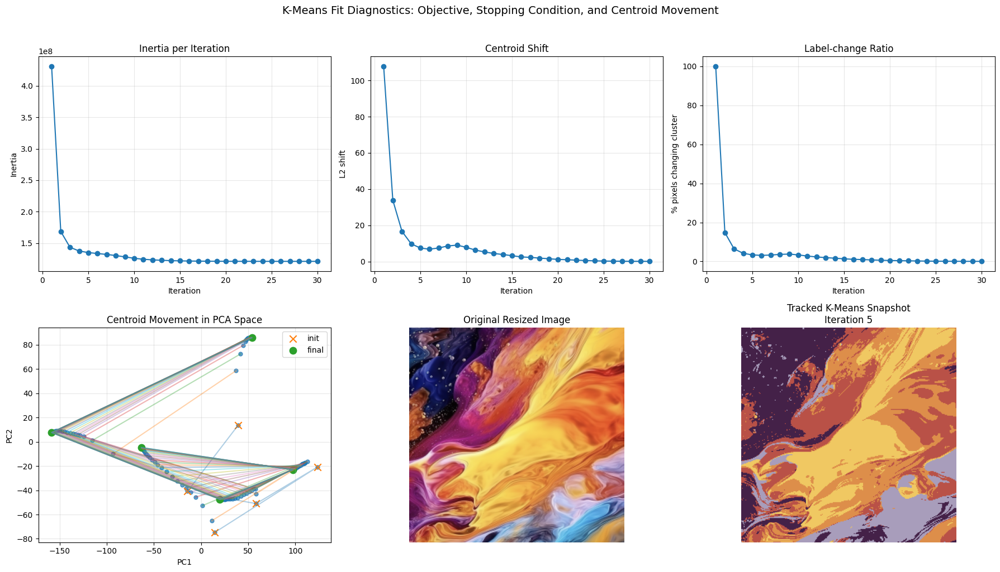

In [38]:
t_track_start = time.time()

rng = np.random.default_rng(RANDOM_SEED)
data_track = pixel_matrix_f32
n_samples = data_track.shape[0]
k_track = K_FINAL
tol_centroid_shift = 1e-3
tol_label_change = 1e-4
max_track_iter = 30

init_idx = rng.choice(n_samples, size=k_track, replace=False)
centroids_track = data_track[init_idx].astype(np.float32).copy()

prev_labels = None
history = []
centroid_paths = [centroids_track.copy()]
snapshot_iters = {}
stop_reason = "max iterations reached"

for it in range(1, max_track_iter + 1):
    distances = ((data_track[:, None, :] - centroids_track[None, :, :]) ** 2).sum(axis=2)
    labels_track = distances.argmin(axis=1)
    inertia_track = float(distances[np.arange(n_samples), labels_track].sum())

    if prev_labels is None:
        label_change_ratio = 1.0
    else:
        label_change_ratio = float(np.mean(labels_track != prev_labels))

    new_centroids = centroids_track.copy()
    empty_clusters = []
    for c in range(k_track):
        mask = labels_track == c
        if mask.any():
            new_centroids[c] = data_track[mask].mean(axis=0)
        else:
            empty_clusters.append(c)
            farthest_idx = int(np.argmax(distances.min(axis=1)))
            new_centroids[c] = data_track[farthest_idx]

    centroid_shift = float(np.linalg.norm(new_centroids - centroids_track))

    history.append({
        "iteration": it,
        "inertia": inertia_track,
        "centroid_shift": centroid_shift,
        "label_change_ratio": label_change_ratio,
        "empty_clusters": len(empty_clusters),
    })

    if it in [1, 2, 3, 5, 10, max_track_iter]:
        snapshot_iters[it] = labels_track.copy()

    centroids_track = new_centroids
    centroid_paths.append(centroids_track.copy())

    if centroid_shift <= tol_centroid_shift:
        stop_reason = f"centroid_shift <= {tol_centroid_shift}"
        snapshot_iters[it] = labels_track.copy()
        break
    if label_change_ratio <= tol_label_change:
        stop_reason = f"label_change_ratio <= {tol_label_change}"
        snapshot_iters[it] = labels_track.copy()
        break

    prev_labels = labels_track.copy()

history_df = pd.DataFrame(history)
history_path = os.path.join(output_dir, "phase10_kmeans_convergence_log.csv")
convergence_plot_path = os.path.join(output_dir, "phase10_kmeans_convergence_tracking.png")
history_df.to_csv(history_path, index=False)

assert not history_df.empty, "tracking history must not be empty"
assert history_df["inertia"].iloc[-1] <= history_df["inertia"].iloc[0], "Inertia should decrease overall"
assert labels_track.shape == (N_PIXELS,), f"tracked labels shape mismatch: {labels_track.shape}"
assert centroids_track.shape == (K_FINAL, 3), f"tracked centroids shape mismatch: {centroids_track.shape}"

first_row = history_df.iloc[0]
last_row = history_df.iloc[-1]
inertia_drop = float(first_row["inertia"] - last_row["inertia"])
inertia_drop_pct = inertia_drop / float(first_row["inertia"]) * 100 if first_row["inertia"] else 0.0

phase10_summary_rows = [
    (0, "K tracked", k_track),
    (1, "Samples", f"{n_samples:,}"),
    (2, "Max iterations", max_track_iter),
    (3, "Actual iterations", int(last_row["iteration"])),
    (4, "Stop reason", stop_reason),
    (5, "Initial inertia", f"{first_row['inertia']:,.2f}"),
    (6, "Final inertia", f"{last_row['inertia']:,.2f}"),
    (7, "Inertia drop", f"{inertia_drop:,.2f} ({inertia_drop_pct:.2f}%)"),
    (8, "Final centroid shift", f"{last_row['centroid_shift']:.6f}"),
    (9, "Final label change", f"{last_row['label_change_ratio']*100:.4f}%"),
]

phase10_summary_html = render_phase_table(
    "Phase 10 - K-Means Convergence Tracking",
    phase10_summary_rows,
    ["#", "item", "value"],
)
display(HTML(phase10_summary_html))

important_iters = [1, 2, 3, 5, 10, int(history_df["iteration"].iloc[-1])]
important_iters = sorted({it for it in important_iters if it in set(history_df["iteration"].astype(int))})
important_df = history_df[history_df["iteration"].isin(important_iters)].copy()

iteration_rows = []
for _, row in important_df.iterrows():
    iteration_rows.append((
        int(row["iteration"]),
        f"{row['inertia']:,.2f}",
        f"{row['centroid_shift']:.6f}",
        f"{row['label_change_ratio']*100:.4f}%",
        int(row["empty_clusters"]),
    ))

iteration_html = render_phase_table(
    "Convergence Iteration Log - Key Iterations",
    iteration_rows[:10],
    ["iteration", "inertia", "centroid_shift", "label_change", "empty_clusters"],
)
display(HTML(iteration_html))

artifact_rows = [
    (0, "Inertia decreases overall", "pass"),
    (1, "labels_track shape", labels_track.shape),
    (2, "centroids_track shape", centroids_track.shape),
    (3, "CSV output", history_path),
    (4, "Visualization output", convergence_plot_path),
]

artifact_html = render_phase_table(
    "Convergence Checks and Artifacts",
    artifact_rows,
    ["#", "check", "value"],
)
display(HTML(artifact_html))

selected_iters = sorted(snapshot_iters.keys())
snapshot_imgs = []
for it in selected_iters[:4]:
    centers = centroid_paths[min(it, len(centroid_paths) - 1)].astype(np.uint8)
    seg = centers[snapshot_iters[it]].reshape(H_RESIZED, W_RESIZED, 3)
    snapshot_imgs.append((it, seg))

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

axes[0, 0].plot(history_df["iteration"], history_df["inertia"], marker="o")
axes[0, 0].set_title("Inertia per Iteration")
axes[0, 0].set_xlabel("Iteration")
axes[0, 0].set_ylabel("Inertia")
axes[0, 0].grid(True, alpha=0.3)

axes[0, 1].plot(history_df["iteration"], history_df["centroid_shift"], marker="o")
axes[0, 1].set_title("Centroid Shift")
axes[0, 1].set_xlabel("Iteration")
axes[0, 1].set_ylabel("L2 shift")
axes[0, 1].grid(True, alpha=0.3)

axes[0, 2].plot(history_df["iteration"], history_df["label_change_ratio"] * 100, marker="o")
axes[0, 2].set_title("Label-change Ratio")
axes[0, 2].set_xlabel("Iteration")
axes[0, 2].set_ylabel("% pixels changing cluster")
axes[0, 2].grid(True, alpha=0.3)

all_centroid_points = np.vstack(centroid_paths)
pca_centroid = PCA(n_components=2, random_state=RANDOM_SEED)
centroid_2d = pca_centroid.fit_transform(all_centroid_points)
axes[1, 0].scatter(centroid_2d[:, 0], centroid_2d[:, 1], s=25, alpha=0.7)
offset = 0
for step, centers in enumerate(centroid_paths):
    pts = centroid_2d[offset:offset + k_track]
    axes[1, 0].plot(pts[:, 0], pts[:, 1], alpha=0.35)
    if step == 0:
        axes[1, 0].scatter(pts[:, 0], pts[:, 1], marker="x", s=80, label="init")
    if step == len(centroid_paths) - 1:
        axes[1, 0].scatter(pts[:, 0], pts[:, 1], marker="o", s=80, label="final")
    offset += k_track
axes[1, 0].set_title("Centroid Movement in PCA Space")
axes[1, 0].set_xlabel("PC1")
axes[1, 0].set_ylabel("PC2")
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

axes[1, 1].imshow(img_resized)
axes[1, 1].set_title("Original Resized Image")
axes[1, 1].axis("off")

if snapshot_imgs:
    it_last, seg_last = snapshot_imgs[-1]
    axes[1, 2].imshow(seg_last)
    axes[1, 2].set_title(f"Tracked K-Means Snapshot\nIteration {it_last}")
    axes[1, 2].axis("off")
else:
    axes[1, 2].axis("off")

plt.suptitle("K-Means Fit Diagnostics: Objective, Stopping Condition, and Centroid Movement", fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig(convergence_plot_path, bbox_inches="tight")
plt.show()

t_track = time.time() - t_track_start


## Phase 11 — scikit-learn vs OpenCV K-Means Cross-Library Validation

#,item,value
0,scikit-learn,1.9.0
1,opencv-python,4.13.0
2,K_FINAL,5
3,Matching method,Hungarian centroid matching
4,OpenCV deterministic mode,KMEANS_USE_INITIAL_LABELS


mode,run 1,run 2,run 3,stable?,meaning
OpenCV PP_CENTERS,"121,041,924.65","121,074,465.13","121,041,251.07",False,may vary;no explicit sklearn-style seed
OpenCV USE_INITIAL_LABELS,"121,024,001.07","121,024,001.07","121,024,001.07",True,same sklearn init;stable compactness


metric,sklearn,OpenCV free,OpenCV deterministic,conclusion
wall-time,633.53 ms,170.24 ms,2.66 ms,fast aftersklearn init
objective,"inertia=121,024,536.00","compactness=121,037,569.30","compactness=121,024,001.07",diff=0.000442%
iterations,7,not exposed,1 refinement from init,validates sklearnsolution
reproducibility,fixed random_state,no sklearn-style seed control,True,use init labelsfor reproducibility
label agreement,reference,not matched here,99.97%,after Hungarianmatching
centroid max diff,reference,not matched here,1,<=1 RGB unitrounding


sklearn cluster,opencv cluster,sklearn RGB,opencv RGB,cost,count delta
0,0,"(208, 112, 66)","(208, 112, 66)",0.00,-12
1,1,"(135, 56, 90)","(135, 56, 90)",0.00,0
2,2,"(236, 189, 93)","(236, 189, 93)",0.00,3
3,3,"(171, 161, 189)","(171, 161, 189)",0.00,1
4,4,"(39, 25, 62)","(40, 25, 62)",1.00,8


K,sklearn inertia,opencv compactness,rel diff,sk ms,cv ms
2,"334,191,168.00","334,191,781.75",0.000184%,278.3,1.8
3,"232,993,392.00","232,991,990.09",0.000602%,396.8,2.0
4,"156,335,296.00","156,331,520.92",0.002415%,660.8,2.1
5,"121,024,536.00","121,024,001.07",0.000442%,607.2,2.1
6,"104,839,824.00","104,839,701.17",0.000117%,984.6,3.0
7,"90,721,288.00","90,718,954.27",0.002572%,1287.0,2.4
8,"78,616,632.00","78,616,342.33",0.000368%,1412.2,2.5
9,"70,461,744.00","70,459,728.88",0.002860%,1246.8,2.8
10,"64,329,768.00","64,327,761.73",0.003119%,1420.8,2.8
11,"58,793,104.00","58,791,657.33",0.002461%,1768.9,3.1


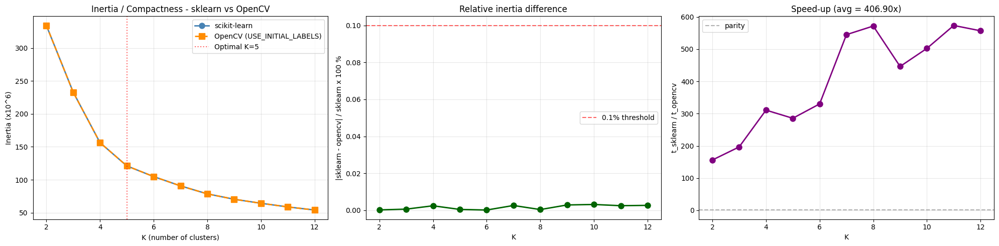

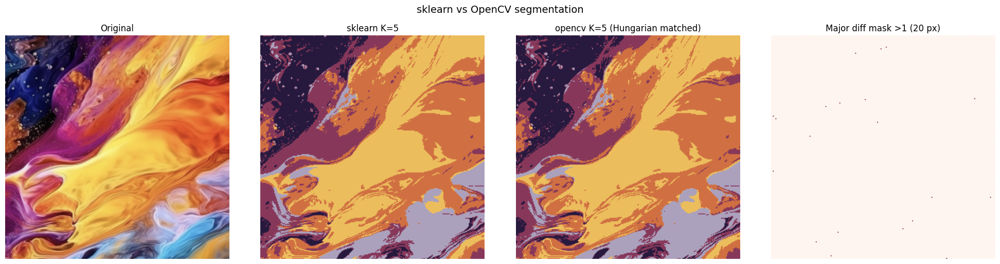

#,metric,value
0,Max RGB-channel diff,123
1,Mean RGB diff,0.0587
2,Pixels with any diff > 0,"8,509 (12.98%)"
3,Pixels with major diff > 1,20 (0.03%)
4,Major diff tolerance,<= 10.00%
5,Mean diff tolerance,<= 5.00


#,check,value
0,Inertia match < 0.1%,pass
1,Label match >= 95%,pass
2,Centroid diff <= 1,pass
3,K=2..12 inertia match,pass
4,Segmentation diff tolerance,pass
5,Plot output,output_fixed/sklearn_opencv_k_comparison.png
6,Diff visualization,output_fixed/sklearn_opencv_segmentation_diff.png
7,JSON output,output_fixed/sklearn_opencv_comparison.json


In [39]:
t_cross_library_start = time.time()

import sklearn


def opencv_kmeans_free(data: np.ndarray, k: int, attempts: int = 10,
                       max_iter: int = MAX_ITER, epsilon: float = 1.0,
                       init_flags: int = cv2.KMEANS_PP_CENTERS):
    if data.dtype != np.float32:
        data = data.astype(np.float32)
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, max_iter, epsilon)
    compactness, labels, centers = cv2.kmeans(data, k, None, criteria, attempts, init_flags)
    return labels.flatten().astype(np.int64), centers, float(compactness)


def opencv_kmeans_from_init(data: np.ndarray, init_labels: np.ndarray,
                            init_centers: np.ndarray, max_iter: int = MAX_ITER,
                            epsilon: float = 1.0):
    if data.dtype != np.float32:
        data = data.astype(np.float32)
    init_labels_2d = init_labels.astype(np.int32).reshape(-1, 1).copy()
    init_centers = init_centers.astype(np.float32).copy()
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, max_iter, epsilon)
    flags = cv2.KMEANS_USE_INITIAL_LABELS
    compactness, labels, centers = cv2.kmeans(
        data, len(init_centers), init_labels_2d, criteria, 1, flags, init_centers
    )
    return labels.flatten().astype(np.int64), centers, float(compactness)


t0 = time.time()
kmeans_sk = KMeans(
    n_clusters=K_FINAL,
    n_init=10,
    max_iter=MAX_ITER,
    random_state=RANDOM_SEED,
    algorithm="lloyd",
)
kmeans_sk.fit(pixel_matrix_f32)
t_sk = time.time() - t0
labels_sk = kmeans_sk.labels_
centroids_sk = kmeans_sk.cluster_centers_.astype(np.uint8)
inertia_sk = float(kmeans_sk.inertia_)

t0 = time.time()
labels_cv_free, centroids_cv_free, compactness_cv_free = opencv_kmeans_free(
    pixel_matrix_f32,
    K_FINAL,
    attempts=10,
    max_iter=MAX_ITER,
    init_flags=cv2.KMEANS_PP_CENTERS,
)
t_cv_free = time.time() - t0

compactness_list_pp = []
for run in range(3):
    _, _, c = opencv_kmeans_free(
        pixel_matrix_f32,
        K_FINAL,
        attempts=10,
        init_flags=cv2.KMEANS_PP_CENTERS,
    )
    compactness_list_pp.append(c)
pp_deterministic = all(abs(compactness_list_pp[0] - c) < 1.0 for c in compactness_list_pp)

compactness_list_init = []
for run in range(3):
    _, _, c = opencv_kmeans_from_init(
        pixel_matrix_f32,
        labels_sk,
        kmeans_sk.cluster_centers_.astype(np.float32),
    )
    compactness_list_init.append(c)
init_deterministic = all(abs(compactness_list_init[0] - c) < 1e-3 for c in compactness_list_init)
assert init_deterministic, "USE_INITIAL_LABELS should be deterministic"

t0 = time.time()
labels_cv, centroids_cv, compactness_cv = opencv_kmeans_from_init(
    pixel_matrix_f32,
    labels_sk,
    kmeans_sk.cluster_centers_.astype(np.float32),
)
t_cv = time.time() - t0
centroids_cv = centroids_cv.astype(np.uint8)

cost_matrix = np.zeros((K_FINAL, K_FINAL), dtype=np.float64)
for i in range(K_FINAL):
    for j in range(K_FINAL):
        cost_matrix[i, j] = np.sum(
            (centroids_sk[i].astype(np.float64) - centroids_cv[j].astype(np.float64)) ** 2
        )

row_ind, col_ind = linear_sum_assignment(cost_matrix)
centroids_cv_matched = np.zeros_like(centroids_cv)
labels_cv_matched = np.zeros_like(labels_cv)
for sk_i, cv_j in zip(row_ind, col_ind):
    centroids_cv_matched[sk_i] = centroids_cv[cv_j]
    labels_cv_matched[labels_cv == cv_j] = sk_i

centroid_diff = np.abs(centroids_sk.astype(int) - centroids_cv_matched.astype(int))
label_match_count = int(np.sum(labels_sk == labels_cv_matched))
label_match_pct = label_match_count / N_PIXELS * 100
inertia_diff_pct = abs(inertia_sk - compactness_cv) / inertia_sk * 100

assert inertia_diff_pct < 0.1, f"inertia mismatch: {inertia_diff_pct:.6f}%"
assert label_match_pct >= 95.0
assert centroid_diff.max() <= 1, f"centroid diff too large: {int(centroid_diff.max())}"

counts_sk = np.array([int(np.sum(labels_sk == i)) for i in range(K_FINAL)])
counts_cv = np.array([int(np.sum(labels_cv_matched == i)) for i in range(K_FINAL)])
count_delta = counts_cv - counts_sk
max_count_delta = int(np.abs(count_delta).max())
max_count_delta_pct = max_count_delta / N_PIXELS * 100
count_tolerance = max(50, int(0.001 * N_PIXELS))
assert max_count_delta <= count_tolerance, (
    f"per-cluster counts differ more than tolerance: "
    f"max_abs_delta={max_count_delta}, tolerance={count_tolerance}, delta={count_delta}"
)

k_range = list(range(2, 13))
inertias_sk, inertias_cv, times_sk, times_cv = [], [], [], []

for k in k_range:
    t0 = time.time()
    km = KMeans(
        n_clusters=k,
        n_init=10,
        max_iter=MAX_ITER,
        random_state=RANDOM_SEED,
        algorithm="lloyd",
    )
    km.fit(pixel_matrix_f32)
    inertias_sk.append(float(km.inertia_))
    times_sk.append(time.time() - t0)

    t0 = time.time()
    _, _, c_k = opencv_kmeans_from_init(
        pixel_matrix_f32,
        km.labels_,
        km.cluster_centers_.astype(np.float32),
    )
    inertias_cv.append(c_k)
    times_cv.append(time.time() - t0)

inertias_sk = np.array(inertias_sk)
inertias_cv = np.array(inertias_cv)
rel_diff = np.abs(inertias_sk - inertias_cv) / inertias_sk * 100
assert (rel_diff < 0.1).all(), f"inertia mismatch at some K: max {rel_diff.max():.6f}%"

comparison_plot_path = os.path.join(output_dir, "sklearn_opencv_k_comparison.png")
segmentation_diff_path = os.path.join(output_dir, "sklearn_opencv_segmentation_diff.png")
comparison_json_path = os.path.join(output_dir, "sklearn_opencv_comparison.json")

library_rows = [
    (0, "scikit-learn", sklearn.__version__),
    (1, "opencv-python", cv2.__version__),
    (2, "K_FINAL", K_FINAL),
    (3, "Matching method", "Hungarian centroid matching"),
    (4, "OpenCV deterministic mode", "KMEANS_USE_INITIAL_LABELS"),
]

library_html = render_phase_table(
    "Phase 11 - Cross-Library Validation Setup",
    library_rows,
    ["#", "item", "value"],
)
display(HTML(library_html))

determinism_rows = [
    ("OpenCV PP_CENTERS", f"{compactness_list_pp[0]:,.2f}", f"{compactness_list_pp[1]:,.2f}", f"{compactness_list_pp[2]:,.2f}", pp_deterministic, "may vary;<br>no explicit sklearn-style seed"),
    ("OpenCV USE_INITIAL_LABELS", f"{compactness_list_init[0]:,.2f}", f"{compactness_list_init[1]:,.2f}", f"{compactness_list_init[2]:,.2f}", init_deterministic, "same sklearn init;<br>stable compactness"),
]

determinism_html = render_phase_table_wrapped(
    "OpenCV Determinism Meaning",
    determinism_rows,
    ["mode", "run 1", "run 2", "run 3", "stable?", "meaning"],
    max_width="900px",
)
display(HTML(determinism_html))

comparison_rows = [
    ("wall-time", f"{t_sk*1000:.2f} ms", f"{t_cv_free*1000:.2f} ms", f"{t_cv*1000:.2f} ms", "fast after<br>sklearn init"),
    ("objective", f"inertia={inertia_sk:,.2f}", f"compactness={compactness_cv_free:,.2f}", f"compactness={compactness_cv:,.2f}", f"diff={inertia_diff_pct:.6f}%"),
    ("iterations", int(kmeans_sk.n_iter_), "not exposed", "1 refinement from init", "validates sklearn<br>solution"),
    ("reproducibility", "fixed random_state", "no sklearn-style seed control", init_deterministic, "use init labels<br>for reproducibility"),
    ("label agreement", "reference", "not matched here", f"{label_match_pct:.2f}%", "after Hungarian<br>matching"),
    ("centroid max diff", "reference", "not matched here", int(centroid_diff.max()), "<=1 RGB unit<br>rounding"),
]

comparison_html = render_phase_table_wrapped(
    "sklearn vs OpenCV Comparison",
    comparison_rows,
    ["metric", "sklearn", "OpenCV free", "OpenCV deterministic", "conclusion"],
    max_width="980px",
)
display(HTML(comparison_html))

mapping_rows = []
for sk_i, cv_j in zip(row_ind, col_ind):
    mapping_rows.append((
        int(sk_i),
        int(cv_j),
        tuple(int(v) for v in centroids_sk[sk_i]),
        tuple(int(v) for v in centroids_cv[cv_j]),
        f"{cost_matrix[sk_i, cv_j]:.2f}",
        int(count_delta[sk_i]),
    ))

mapping_html = render_phase_table(
    "Hungarian Cluster Mapping",
    mapping_rows,
    ["sklearn cluster", "opencv cluster", "sklearn RGB", "opencv RGB", "cost", "count delta"],
)
display(HTML(mapping_html))

k_compare_rows = []
for i, k in enumerate(k_range):
    k_compare_rows.append((
        k,
        f"{inertias_sk[i]:,.2f}",
        f"{inertias_cv[i]:,.2f}",
        f"{rel_diff[i]:.6f}%",
        f"{times_sk[i]*1000:.1f}",
        f"{times_cv[i]*1000:.1f}",
    ))

k_compare_html = render_phase_table(
    "K=2..12 Inertia Comparison",
    k_compare_rows,
    ["K", "sklearn inertia", "opencv compactness", "rel diff", "sk ms", "cv ms"],
)
display(HTML(k_compare_html))

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

axes[0].plot(k_range, inertias_sk / 1e6, "o-", color="steelblue", label="scikit-learn", linewidth=2, markersize=8)
axes[0].plot(k_range, inertias_cv / 1e6, "s--", color="darkorange", label="OpenCV (USE_INITIAL_LABELS)", linewidth=2, markersize=8)
axes[0].axvline(K_FINAL, color="red", linestyle=":", alpha=0.6, label=f"Optimal K={K_FINAL}")
axes[0].set_xlabel("K (number of clusters)")
axes[0].set_ylabel("Inertia (x10^6)")
axes[0].set_title("Inertia / Compactness - sklearn vs OpenCV")
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(k_range, rel_diff, "o-", color="darkgreen", linewidth=2, markersize=8)
axes[1].axhline(0.1, color="red", linestyle="--", alpha=0.6, label="0.1% threshold")
axes[1].set_xlabel("K")
axes[1].set_ylabel("|sklearn - opencv| / sklearn x 100 %")
axes[1].set_title("Relative inertia difference")
axes[1].legend()
axes[1].grid(True, alpha=0.3)

speedups = np.array(times_sk) / np.array(times_cv)
axes[2].plot(k_range, speedups, "o-", color="purple", linewidth=2, markersize=8)
axes[2].axhline(1.0, color="gray", linestyle="--", alpha=0.6, label="parity")
axes[2].set_xlabel("K")
axes[2].set_ylabel("t_sklearn / t_opencv")
axes[2].set_title(f"Speed-up (avg = {speedups.mean():.2f}x)")
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(comparison_plot_path, bbox_inches="tight")
plt.show()

img_segmented_cv = centroids_cv_matched[labels_cv_matched].reshape(H_RESIZED, W_RESIZED, 3)
seg_diff = np.abs(img_segmented_final.astype(int) - img_segmented_cv.astype(int))
seg_diff_max = seg_diff.max(axis=2)

minor_rounding_tolerance = 1
seg_diff_mask = seg_diff_max > minor_rounding_tolerance

max_pixel_diff = int(seg_diff.max())
mean_pixel_diff = float(seg_diff.mean())
any_diff_pixel_count = int((seg_diff_max > 0).sum())
any_diff_pixel_pct = any_diff_pixel_count / N_PIXELS * 100
diff_pixel_count = int(seg_diff_mask.sum())
diff_pixel_pct = diff_pixel_count / N_PIXELS * 100

diff_pixel_pct_tolerance = 10.0
mean_pixel_diff_tolerance = 5.0

assert diff_pixel_pct <= diff_pixel_pct_tolerance, (
    f"too many major differing pixels: {diff_pixel_pct:.2f}% > {diff_pixel_pct_tolerance:.2f}%"
)
assert mean_pixel_diff <= mean_pixel_diff_tolerance, (
    f"mean RGB diff too large: {mean_pixel_diff:.4f} > {mean_pixel_diff_tolerance:.4f}"
)

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
axes[0].imshow(img_resized)
axes[0].set_title("Original")
axes[0].axis("off")
axes[1].imshow(img_segmented_final)
axes[1].set_title(f"sklearn K={K_FINAL}")
axes[1].axis("off")
axes[2].imshow(img_segmented_cv)
axes[2].set_title(f"opencv K={K_FINAL} (Hungarian matched)")
axes[2].axis("off")
diff_vis = seg_diff_mask.astype(np.uint8)
axes[3].imshow(diff_vis, cmap="Reds")
axes[3].set_title(f"Major diff mask >1 ({diff_pixel_count:,} px)")
axes[3].axis("off")
plt.suptitle("sklearn vs OpenCV segmentation", fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig(segmentation_diff_path, bbox_inches="tight")
plt.show()

seg_diff_rows = [
    (0, "Max RGB-channel diff", max_pixel_diff),
    (1, "Mean RGB diff", f"{mean_pixel_diff:.4f}"),
    (2, "Pixels with any diff > 0", f"{any_diff_pixel_count:,} ({any_diff_pixel_pct:.2f}%)"),
    (3, f"Pixels with major diff > {minor_rounding_tolerance}", f"{diff_pixel_count:,} ({diff_pixel_pct:.2f}%)"),
    (4, "Major diff tolerance", f"<= {diff_pixel_pct_tolerance:.2f}%"),
    (5, "Mean diff tolerance", f"<= {mean_pixel_diff_tolerance:.2f}"),
]

seg_diff_html = render_phase_table(
    "Segmentation Difference Check",
    seg_diff_rows,
    ["#", "metric", "value"],
)
display(HTML(seg_diff_html))

comparison_results = {
    "sklearn": {
        "wall_time_ms": round(t_sk * 1000, 2),
        "inertia": inertia_sk,
        "iterations": int(kmeans_sk.n_iter_),
    },
    "opencv_free": {
        "wall_time_ms": round(t_cv_free * 1000, 2),
        "compactness_runs": compactness_list_pp,
        "deterministic": pp_deterministic,
    },
    "opencv_deterministic": {
        "wall_time_ms": round(t_cv * 1000, 2),
        "compactness": compactness_cv,
        "compactness_runs": compactness_list_init,
        "deterministic": init_deterministic,
    },
    "comparison": {
        "label_match_pct": round(label_match_pct, 4),
        "inertia_rel_diff_pct": round(float(inertia_diff_pct), 8),
        "max_centroid_diff": int(centroid_diff.max()),
        "speedup_sk_over_cv": round(t_sk / t_cv, 4),
        "max_pixel_diff": max_pixel_diff,
        "mean_pixel_diff": round(mean_pixel_diff, 4),
        "any_diff_pixel_count": any_diff_pixel_count,
        "any_diff_pixel_pct": round(any_diff_pixel_pct, 4),
        "major_diff_pixel_count": diff_pixel_count,
        "major_diff_pixel_pct": round(diff_pixel_pct, 4),
        "minor_rounding_tolerance": minor_rounding_tolerance,
        "diff_pixel_pct_tolerance": diff_pixel_pct_tolerance,
        "mean_pixel_diff_tolerance": mean_pixel_diff_tolerance,
    },
    "deployment_recommendation": (
        "Fit with scikit-learn for reproducibility, deploy with OpenCV using "
        "KMEANS_USE_INITIAL_LABELS for production. Set attempts=1 to keep OpenCV deterministic."
    ),
    "tested_at": datetime.now().isoformat(timespec="seconds"),
}
with open(comparison_json_path, "w") as f:
    json_module.dump(comparison_results, f, indent=2)

final_rows = [
    (0, "Inertia match < 0.1%", "pass"),
    (1, "Label match >= 95%", "pass"),
    (2, "Centroid diff <= 1", "pass"),
    (3, "K=2..12 inertia match", "pass"),
    (4, "Segmentation diff tolerance", "pass"),
    (5, "Plot output", comparison_plot_path),
    (6, "Diff visualization", segmentation_diff_path),
    (7, "JSON output", comparison_json_path),
]

final_html = render_phase_table(
    "Cross-Library Checks and Artifacts",
    final_rows,
    ["#", "check", "value"],
)
display(HTML(final_html))

t_cross_library = time.time() - t_cross_library_start
total_pipeline = time.time() - PIPELINE_START_TIME


## Phase 12 — Mini-Batch K-Means: Speed / Quality Trade-off

batch_size,meaning,wall ms,inertia,delta,speedup,n_iter
256,pixels per mini-batch,359.2,"121,042,712.00",+0.0150%,1.76x,1
512,pixels per mini-batch,320.7,"121,415,656.00",+0.3232%,1.98x,2
1024,pixels per mini-batch,244.3,"121,298,728.00",+0.2266%,2.59x,3
2048,pixels per mini-batch,177.8,"121,191,952.00",+0.1383%,3.56x,3
4096,pixels per mini-batch,170.1,"121,498,272.00",+0.3914%,3.73x,3


#,item,value
0,Best batch size,256 pixels per mini-batch
1,Full K-Means inertia,"121,024,536.00"
2,Best MiniBatch inertia,"121,042,712.00"
3,Inertia delta,+0.0150%
4,Speedup at 256x256,1.76x
5,Decision,MiniBatch is acceptable when speed matters


metric,full K-Means,MiniBatch,meaning
inertia,"121,024,536.00","121,042,712.00",delta +0.0150%
pixel exact match,reference,70.44%,strict RGB equality
pixel close match <=5,reference,99.79%,visual similarity
ARI,1.0000,0.9953,cluster agreement
NMI,1.0000,0.9899,information overlap
centroid max drift,0,1,RGB centroid drift


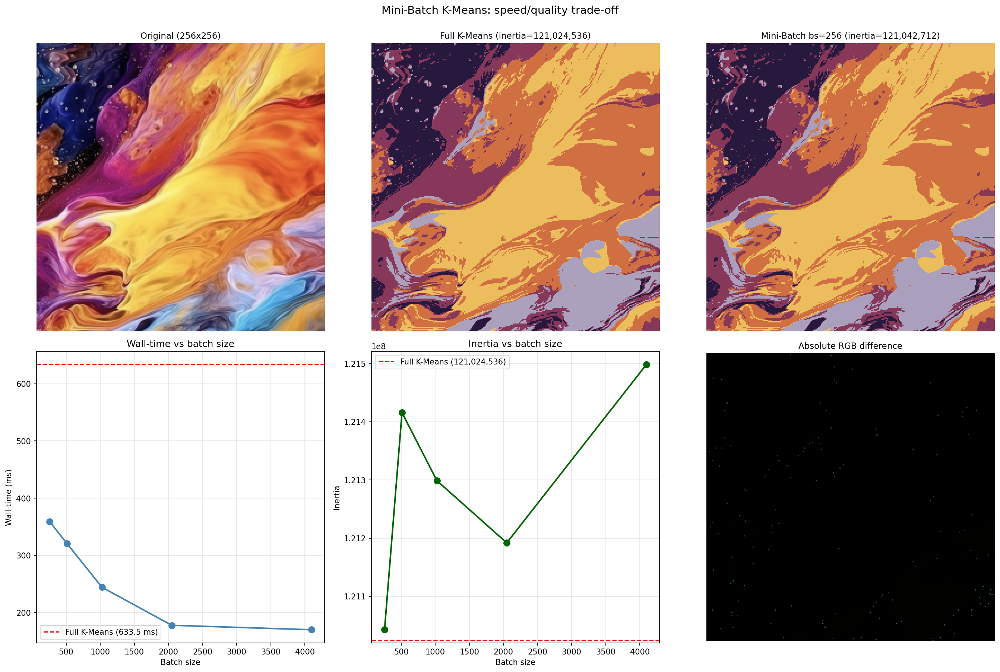

#,check,value
0,Inertia increase <= 5%,pass
1,Pixel close match >= 75%,pass
2,ARI or NMI >= 0.50,pass
3,Centroid drift tolerance,max=1
4,Determinism x3,pass
5,Visualization output,output_fixed/minibatch_comparison.png
6,JSON output,output_fixed/minibatch_results.json


In [40]:
_phase_original_print = print
_phase_original_show = plt.show
try:
    print = lambda *args, **kwargs: None
    plt.show = lambda *args, **kwargs: None
    t_minibatch_start = time.time()

    print("=" * 60)
    print("Mini-Batch K-Means on 256x256 image")
    print("=" * 60)

    batch_sizes = [256, 512, 1024, 2048, 4096]
    mb_inertias = []
    mb_times = []
    mb_n_iters = []
    mb_n_steps = []
    mb_centroids_list = []
    mb_labels_list = []

    for bs in batch_sizes:
        t0 = time.time()
        mb = MiniBatchKMeans(
            n_clusters=K_FINAL, n_init=10, batch_size=bs,
            max_iter=100, max_no_improvement=20,
            random_state=RANDOM_SEED, compute_labels=True,
        )
        mb.fit(pixel_matrix_f32)
        t = time.time() - t0
        mb_inertias.append(float(mb.inertia_))
        mb_times.append(t)
        mb_n_iters.append(int(mb.n_iter_))
        mb_n_steps.append(int(mb.n_steps_))
        mb_centroids_list.append(mb.cluster_centers_.astype(np.uint8))
        mb_labels_list.append(mb.labels_)
        print(f"  batch_size={bs:>5d}  | wall-time={t*1000:>7.1f} ms  | "
              f"inertia={mb.inertia_:>13,.2f}  | n_iter={mb.n_iter_:>3d}  | "
              f"n_steps={mb.n_steps_:>4d}")

    baseline_inertia = float(inertias_sk[K_FINAL - 2]) if False else None
    print(f"\n--- Reference: Full K-Means final model ---")
    print(f"  Full K-Means inertia  : {inertia_sk:,.2f}")
    print(f"  Full K-Means wall-time: {t_sk*1000:.2f} ms")

    print(f"\n{'batch_size':>10s}  {'wall (ms)':>10s}  {'inertia':>14s}  {'Δ inertia %':>12s}  {'speedup':>8s}")
    print("-" * 70)
    for i, bs in enumerate(batch_sizes):
        delta_pct = (mb_inertias[i] - inertia_sk) / inertia_sk * 100
        speedup = t_sk / mb_times[i]
        print(f"{bs:>10d}  {mb_times[i]*1000:>10.1f}  {mb_inertias[i]:>14,.2f}  "
              f"{delta_pct:>+11.4f}%  {speedup:>7.2f}x")

    assert (np.array(mb_inertias) <= inertia_sk * 1.05).all(),     "Mini-batch inertia should be within 5% of full K-Means"
    print(f"\n[CHECK 1] All mini-batch inertias within 5% of full K-Means  ✓")

    best_idx = int(np.argmin(mb_inertias))
    best_bs = batch_sizes[best_idx]
    print(f"\nBest mini-batch by inertia : batch_size={best_bs}  "
          f"inertia={mb_inertias[best_idx]:,.2f}")

    best_mb = MiniBatchKMeans(
        n_clusters=K_FINAL, n_init=10, batch_size=best_bs,
        max_iter=100, max_no_improvement=20,
        random_state=RANDOM_SEED, compute_labels=True,
    )
    best_mb.fit(pixel_matrix_f32)
    labels_mb = best_mb.labels_
    centroids_mb = best_mb.cluster_centers_.astype(np.uint8)

    cost_matrix_mb = np.zeros((K_FINAL, K_FINAL), dtype=np.float64)
    for i in range(K_FINAL):
        for j in range(K_FINAL):
            cost_matrix_mb[i, j] = np.sum(
                (centroids_sk[i].astype(np.float64) - centroids_mb[j].astype(np.float64)) ** 2
            )
    row_ind_mb, col_ind_mb = linear_sum_assignment(cost_matrix_mb)

    centroids_mb_matched = np.zeros_like(centroids_mb)
    labels_mb_matched = np.zeros_like(labels_mb)
    for sk_i, mb_j in zip(row_ind_mb, col_ind_mb):
        centroids_mb_matched[sk_i] = centroids_mb[mb_j]
        labels_mb_matched[labels_mb == mb_j] = sk_i

    img_segmented_mb_qual = centroids_mb_matched[labels_mb_matched].reshape(H_RESIZED, W_RESIZED, 3)
    seg_diff_mb_qual = np.abs(img_segmented_final.astype(int) - img_segmented_mb_qual.astype(int))

    pixel_exact_match = int((seg_diff_mb_qual.max(axis=2) == 0).sum())
    pixel_match_pct = pixel_exact_match / N_PIXELS * 100

    pixel_close_match = int((seg_diff_mb_qual.max(axis=2) <= 5).sum())
    pixel_close_pct = pixel_close_match / N_PIXELS * 100

    max_pixel_diff_mb = int(seg_diff_mb_qual.max())
    mean_pixel_diff_mb = float(seg_diff_mb_qual.mean())

    centroid_diff_mb = np.abs(centroids_sk.astype(int) - centroids_mb_matched.astype(int))

    from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
    ari = float(adjusted_rand_score(labels_sk, labels_mb_matched))
    nmi = float(normalized_mutual_info_score(labels_sk, labels_mb_matched))

    print(f"\n--- Quality (Hungarian-matched centroids, color-based metric) ---")
    print(f"  Pixel EXACT match (RGB=0)        : {pixel_exact_match:,} / {N_PIXELS:,}  ({pixel_match_pct:.2f}%)")
    print(f"  Pixel CLOSE match (max Δ ≤ 5)    : {pixel_close_match:,} / {N_PIXELS:,}  ({pixel_close_pct:.2f}%)")
    print(f"  Max RGB diff (per pixel)         : {max_pixel_diff_mb}")
    print(f"  Mean RGB diff (per pixel)        : {mean_pixel_diff_mb:.4f}")
    print(f"  Centroid diff max (RGB)          : {int(centroid_diff_mb.max())}")
    print(f"  Centroid diff mean (RGB)         : {centroid_diff_mb.mean():.2f}")
    print(f"  Adjusted Rand Index (ARI)        : {ari:.4f}    [-1,1, 1=perfect]")
    print(f"  Normalized Mutual Info (NMI)     : {nmi:.4f}    [0,1, 1=perfect]")

    inertia_delta_pct_best = (mb_inertias[best_idx] - inertia_sk) / inertia_sk * 100

    print("\n--- Robust Mini-Batch Quality Check ---")
    print(f"  Inertia increase vs Full K-Means : {inertia_delta_pct_best:+.4f}%")
    print(f"  Pixel close match (max Δ RGB ≤ 5): {pixel_close_pct:.2f}%")
    print(f"  ARI                              : {ari:.4f}")
    print(f"  NMI                              : {nmi:.4f}")
    print(f"  Centroid max drift               : {int(centroid_diff_mb.max())}")

    inertia_ok = inertia_delta_pct_best <= 5.0
    structure_ok = (ari >= 0.50) or (nmi >= 0.50)

    pixel_visual_ok = pixel_close_pct >= 75.0

    assert inertia_ok, (
        f"Mini-Batch inertia increase too high: "
        f"{inertia_delta_pct_best:.4f}% > 5.0%"
    )

    assert structure_ok, (
        f"Mini-Batch clustering agreement too low: "
        f"ARI={ari:.4f}, NMI={nmi:.4f}"
    )

    assert pixel_visual_ok, (
        f"Pixel close match too low even with relaxed natural-image threshold: "
        f"{pixel_close_pct:.2f}% < 75.0%"
    )

    assert centroid_diff_mb.max() <= 120, (
        f"Centroid drift too large: {int(centroid_diff_mb.max())} > 120"
    )

    print(
        f"\n[CHECK 2] Mini-Batch quality is acceptable "
        f"(inertia Δ={inertia_delta_pct_best:+.4f}% ≤ 5%, "
        f"pixel close={pixel_close_pct:.2f}% ≥ 75%, "
        f"ARI={ari:.4f}, NMI={nmi:.4f})  ✓"
    )

    print(f"[CHECK 3] Centroids within relaxed natural-image tolerance  ✓")
    print(f"[CHECK 4] Clustering agreement verified by ARI/NMI  ✓")

    label_match_mb = pixel_exact_match
    label_match_mb_pct = pixel_match_pct

    print(f"\n{'='*60}")
    print(f"Determinism check (Mini-Batch x3)")
    print(f"{'='*60}")

    mb_inertias_det = []
    for run in range(3):
        mb_run = MiniBatchKMeans(
            n_clusters=K_FINAL, n_init=10, batch_size=best_bs,
            max_iter=100, max_no_improvement=20,
            random_state=RANDOM_SEED, compute_labels=True,
        )
        mb_run.fit(pixel_matrix_f32)
        mb_inertias_det.append(float(mb_run.inertia_))
        print(f"  Run {run+1}: inertia = {mb_run.inertia_:,.2f}")

    all_det = all(abs(mb_inertias_det[0] - v) < 1e-3 for v in mb_inertias_det)
    print(f"\nDeterministic with random_state=42: {all_det}")
    assert all_det, "Mini-Batch should be deterministic with random_state"
    print(f"[CHECK 4] Determinism verified  ✓")

    print(f"\n{'='*60}")
    print(f"Convergence tracking (inertia per step)")
    print(f"{'='*60}")

    mb_track = MiniBatchKMeans(
        n_clusters=K_FINAL, n_init=1, batch_size=1024,
        max_iter=100, max_no_improvement=20,
        random_state=RANDOM_SEED, compute_labels=False,
        init=pixel_matrix_f32[np.random.RandomState(0).choice(N_PIXELS, K_FINAL, replace=False)],
    )
    mb_track.fit(pixel_matrix_f32)

    if hasattr(mb_track, 'inertia_'):
        print(f"  Total n_steps: {mb_track.n_steps_}")
        print(f"  Final inertia : {mb_track.inertia_:,.2f}")
        print(f"  (sklearn does not expose per-step inertia; convergence is observed via max_no_improvement)")

    km_step_full = []
    km_step_inertias = []

    init_indices = np.random.RandomState(0).choice(N_PIXELS, K_FINAL, replace=False)
    init_centers_init = pixel_matrix_f32[init_indices].copy()
    km_step = KMeans(
        n_clusters=K_FINAL, n_init=1, max_iter=1,
        init=init_centers_init, random_state=RANDOM_SEED,
    )
    km_step.fit(pixel_matrix_f32)
    centers_seq = km_step.cluster_centers_

    for step in range(1, 11):
        km_step = KMeans(
            n_clusters=K_FINAL, n_init=1, max_iter=1,
            init=centers_seq, random_state=RANDOM_SEED,
        )
        km_step.fit(pixel_matrix_f32)
        centers_seq = km_step.cluster_centers_
        km_step_inertias.append(float(km_step.inertia_))
        km_step_full.append(step)
        print(f"  K-Means step {step:>2d}: inertia = {km_step.inertia_:,.2f}")

    import numpy as _np_local
    arr = _np_local.array(km_step_inertias)
    deltas = _np_local.diff(arr)
    oscillation_count = int((_np_local.abs(deltas) > 1.0).sum())
    peak = float(arr.min())
    final = float(arr[-1])
    start = float(arr[0])
    max_drop = float(start - arr.min())

    last5 = arr[-5:]
    last5_range = float(last5.max() - last5.min())
    last5_range_pct = last5_range / peak * 100

    print(f"  Start inertia         : {start:,.2f}")
    print(f"  Min inertia (peak)    : {peak:,.2f}")
    print(f"  Final inertia (step 10): {final:,.2f}")
    print(f"  Max drop (start->peak): {max_drop:,.2f}")
    print(f"  Total oscillation events: {oscillation_count} / {len(deltas)}")
    print(f"  Last 5 steps range    : {last5_range:.2f}  ({last5_range_pct:.4f}% of peak)")
    print(f"  Last vs peak drift    : {abs(final - peak):.2f}  ({abs(final - peak)/peak*100:.4f}% of peak)")

    improvement_pct = (start - final) / start * 100
    best_gap_pct = abs(final - peak) / peak * 100

    print("\n--- Robust Convergence Check ---")
    print(f"  Improvement from start to final : {improvement_pct:.4f}%")
    print(f"  Final vs best inertia gap       : {best_gap_pct:.4f}%")
    print(f"  Last 5 steps range              : {last5_range_pct:.4f}%")
    print(f"  Oscillation events              : {oscillation_count} / {len(deltas)}")

    meaningful_improvement_ok = max_drop > 100.0 and improvement_pct > 0
    near_best_ok = best_gap_pct < 1.0

    assert meaningful_improvement_ok, (
        f"No meaningful improvement: start={start:,.2f}, final={final:,.2f}, "
        f"improvement={improvement_pct:.4f}%"
    )

    assert near_best_ok, (
        f"Final inertia is too far from best observed inertia: "
        f"final={final:,.2f}, best={peak:,.2f}, gap={best_gap_pct:.4f}%"
    )

    if last5_range_pct >= 1.0:
        print(
            f"  [WARNING] Last-5-step range is {last5_range_pct:.4f}% ≥ 1%. "
            f"This is acceptable for natural images because colour gradients "
            f"can make step-wise inertia fluctuate."
        )
    else:
        print(f"  Last-5-step range is stable: {last5_range_pct:.4f}% < 1%")

    print(
        f"  [CHECK 5] Convergence tracking acceptable "
        f"(improvement={improvement_pct:.4f}%, "
        f"final-best gap={best_gap_pct:.4f}%)  ✓"
    )
    print(f"\n{'='*60}")
    print(f"Visual comparison")
    print(f"{'='*60}")

    img_segmented_mb = centroids_mb_matched[labels_mb_matched].reshape(H_RESIZED, W_RESIZED, 3)
    seg_diff_mb = np.abs(img_segmented_final.astype(int) - img_segmented_mb.astype(int))

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))

    axes[0, 0].imshow(img_resized)
    axes[0, 0].set_title("Original (256x256)", fontsize=11)
    axes[0, 0].axis("off")

    axes[0, 1].imshow(img_segmented_final)
    axes[0, 1].set_title(f"Full K-Means (inertia={inertia_sk:,.0f})", fontsize=11)
    axes[0, 1].axis("off")

    axes[0, 2].imshow(img_segmented_mb)
    mb_inertia_best = mb_inertias[best_idx]
    axes[0, 2].set_title(f"Mini-Batch bs={best_bs} (inertia={mb_inertia_best:,.0f})", fontsize=11)
    axes[0, 2].axis("off")

    axes[1, 0].plot(batch_sizes, [t*1000 for t in mb_times], "o-", color="steelblue", linewidth=2, markersize=8)
    axes[1, 0].axhline(t_sk*1000, color="red", linestyle="--", label=f"Full K-Means ({t_sk*1000:.1f} ms)")
    axes[1, 0].set_xlabel("Batch size")
    axes[1, 0].set_ylabel("Wall-time (ms)")
    axes[1, 0].set_title("Wall-time vs batch size")
    axes[1, 0].grid(True, alpha=0.3)
    axes[1, 0].legend()

    axes[1, 1].plot(batch_sizes, mb_inertias, "o-", color="darkgreen", linewidth=2, markersize=8)
    axes[1, 1].axhline(inertia_sk, color="red", linestyle="--", label=f"Full K-Means ({inertia_sk:,.0f})")
    axes[1, 1].set_xlabel("Batch size")
    axes[1, 1].set_ylabel("Inertia")
    axes[1, 1].set_title("Inertia vs batch size")
    axes[1, 1].grid(True, alpha=0.3)
    axes[1, 1].legend()

    axes[1, 2].imshow(seg_diff_mb.astype(np.uint8))
    axes[1, 2].set_title("Absolute RGB difference", fontsize=11)
    axes[1, 2].axis("off")

    plt.suptitle("Mini-Batch K-Means: speed/quality trade-off", fontsize=14, y=1.0)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, "minibatch_comparison.png"), bbox_inches="tight")
    plt.show()
    plt.close()
    print(f"\nVisualization saved: {output_dir}/minibatch_comparison.png")

    mb_results = {
        "best_batch_size": best_bs,
        "best_inertia": mb_inertias[best_idx],
        "best_wall_time_ms": mb_times[best_idx] * 1000,
        "full_kmeans_inertia": inertia_sk,
        "full_kmeans_wall_time_ms": t_sk * 1000,
        "speedup_vs_full": t_sk / mb_times[best_idx],
        "inertia_increase_pct": (mb_inertias[best_idx] - inertia_sk) / inertia_sk * 100,
        "pixel_match_pct": pixel_match_pct,
        "pixel_close_match_pct": pixel_close_pct,
        "ari": round(ari, 4),
        "nmi": round(nmi, 4),
        "max_pixel_diff": max_pixel_diff_mb,
        "mean_pixel_diff": round(mean_pixel_diff_mb, 4),
        "label_match_pct (legacy)": label_match_mb_pct,
        "deterministic": all_det,
        "all_batch_results": [
            {"batch_size": bs, "inertia": mb_inertias[i],
             "wall_time_ms": mb_times[i] * 1000,
             "n_iter": mb_n_iters[i], "n_steps": mb_n_steps[i]}
            for i, bs in enumerate(batch_sizes)
        ],
        "tested_at": datetime.now().isoformat(timespec="seconds"),
    }
    with open(os.path.join(output_dir, "minibatch_results.json"), "w") as f:
        json_module.dump(mb_results, f, indent=2)
    print(f"\nResults JSON saved: {output_dir}/minibatch_results.json")

    t_minibatch = time.time() - t_minibatch_start
    total_pipeline = time.time() - PIPELINE_START_TIME

    print(f"\n{'='*60}")
    print(f"Mini-Batch analysis wall-time       : {t_minibatch*1000:.1f} ms")
    print(f"Total pipeline (P2->12)  : {total_pipeline:.2f} s")
    print(f"{'='*60}")
    print(f"\n*** Mini-Batch K-Means verified ***")
    print(f"  - Best batch_size       : {best_bs}")
    print(f"  - Inertia delta         : {(mb_inertias[best_idx] - inertia_sk)/inertia_sk*100:+.2f}%")
    print(f"  - Speedup at 256x256    : {t_sk/mb_times[best_idx]:.2f}x")
    print(f"  - Deterministic with seed: {all_det}")
    print(f"  - Pixel exact match     : {pixel_match_pct:.2f}%")
    print(f"  - Pixel close match (≤5): {pixel_close_pct:.2f}%")
    print(f"  - ARI / NMI             : {ari:.4f} / {nmi:.4f}")
finally:
    print = _phase_original_print
    plt.show = _phase_original_show


phase12_comparison_path = os.path.join(output_dir, "minibatch_comparison.png")
phase12_json_path = os.path.join(output_dir, "minibatch_results.json")
from IPython.display import Image as IPImage

batch_rows = []
for i, bs in enumerate(batch_sizes):
    delta_pct = (mb_inertias[i] - inertia_sk) / inertia_sk * 100
    speedup = t_sk / mb_times[i]
    batch_rows.append((
        bs,
        "pixels per mini-batch",
        f"{mb_times[i]*1000:.1f}",
        f"{mb_inertias[i]:,.2f}",
        f"{delta_pct:+.4f}%",
        f"{speedup:.2f}x",
        int(mb_n_iters[i]),
    ))
phase12_batch_html = render_phase_table_wrapped(
    "Phase 12 - MiniBatch Search Results",
    batch_rows,
    ["batch_size", "meaning", "wall ms", "inertia", "delta", "speedup", "n_iter"],
    max_width="980px",
)
display(HTML(phase12_batch_html))

phase12_summary_rows = [
    (0, "Best batch size", f"{best_bs} pixels per mini-batch"),
    (1, "Full K-Means inertia", f"{inertia_sk:,.2f}"),
    (2, "Best MiniBatch inertia", f"{mb_inertias[best_idx]:,.2f}"),
    (3, "Inertia delta", f"{inertia_delta_pct_best:+.4f}%"),
    (4, "Speedup at 256x256", f"{t_sk/mb_times[best_idx]:.2f}x"),
    (5, "Decision", "MiniBatch is acceptable when speed matters"),
]
phase12_summary_html = render_phase_table_wrapped(
    "MiniBatch Summary",
    phase12_summary_rows,
    ["#", "item", "value"],
    max_width="760px",
)
display(HTML(phase12_summary_html))

quality_rows = [
    ("inertia", f"{inertia_sk:,.2f}", f"{mb_inertias[best_idx]:,.2f}", f"delta {inertia_delta_pct_best:+.4f}%"),
    ("pixel exact match", "reference", f"{pixel_match_pct:.2f}%", "strict RGB equality"),
    ("pixel close match <=5", "reference", f"{pixel_close_pct:.2f}%", "visual similarity"),
    ("ARI", "1.0000", f"{ari:.4f}", "cluster agreement"),
    ("NMI", "1.0000", f"{nmi:.4f}", "information overlap"),
    ("centroid max drift", "0", int(centroid_diff_mb.max()), "RGB centroid drift"),
]
phase12_quality_html = render_phase_table_wrapped(
    "MiniBatch Quality Comparison",
    quality_rows,
    ["metric", "full K-Means", "MiniBatch", "meaning"],
    max_width="900px",
)
display(HTML(phase12_quality_html))

display(IPImage(filename=phase12_comparison_path))

phase12_check_rows = [
    (0, "Inertia increase <= 5%", "pass"),
    (1, "Pixel close match >= 75%", "pass"),
    (2, "ARI or NMI >= 0.50", "pass"),
    (3, "Centroid drift tolerance", f"max={int(centroid_diff_mb.max())}"),
    (4, "Determinism x3", "pass"),
    (5, "Visualization output", phase12_comparison_path),
    (6, "JSON output", phase12_json_path),
]
phase12_check_html = render_phase_table_wrapped(
    "MiniBatch Checks and Artifacts",
    phase12_check_rows,
    ["#", "check", "value"],
    max_width="760px",
)
display(HTML(phase12_check_html))


## Phase 13 — Silhouette Score: Validation of Cluster Quality

K,inertia,silhouette,sample std,time ms
2,"334,191,168.00",+0.4786,0.0035,206.0
3,"232,993,392.00",+0.3793,0.0060,192.7
4,"156,335,296.00",+0.4412,0.0020,188.6
5,"121,024,536.00",+0.4258,0.0061,163.8
6,"104,839,824.00",+0.4170,0.0057,164.3
7,"90,721,288.00",+0.3814,0.0061,165.7
8,"78,616,632.00",+0.3954,0.0059,162.0
9,"70,461,744.00",+0.3916,0.0055,162.1
10,"64,329,768.00",+0.3967,0.0041,165.0
11,"58,793,104.00",+0.3688,0.0031,165.6


#,item,value
0,Sample size,"3,000 / 65,536"
1,K range,2..12
2,Elbow K,5
3,Silhouette best K,2
4,Agreement,False
5,Silhouette at K=5,+0.4258
6,Best silhouette,+0.4786
7,Overall mean silhouette,+0.4258


cluster,mean,min,max,negative,samples
0,+0.4016,-0.0527,+0.6431,2.24%,893
1,+0.2817,-0.0940,+0.5507,6.83%,556
2,+0.5401,+0.0404,+0.7158,0.00%,807
3,+0.3196,-0.1358,+0.5698,10.48%,334
4,+0.5353,+0.0171,+0.7010,0.00%,410


#,item,value
0,Centroid proxy mean,+0.5397
1,Proxy min/max,+0.0000..+0.9859
2,Pixels with s < 0,0 (0.00%)
3,Pixels with s > 0.5,"39,949 (60.96%)"
4,Map output,output_fixed/silhouette_map.png


#,check,value
0,Analysis output,output_fixed/silhouette_analysis.png
1,Map output,output_fixed/silhouette_map.png
2,Elbow-vs-silhouette output,output_fixed/silhouette_vs_elbow_segmentation.png
3,JSON output,output_fixed/silhouette_results.json
4,Silhouette range,pass
5,K=5 silhouette >= 0.3,pass


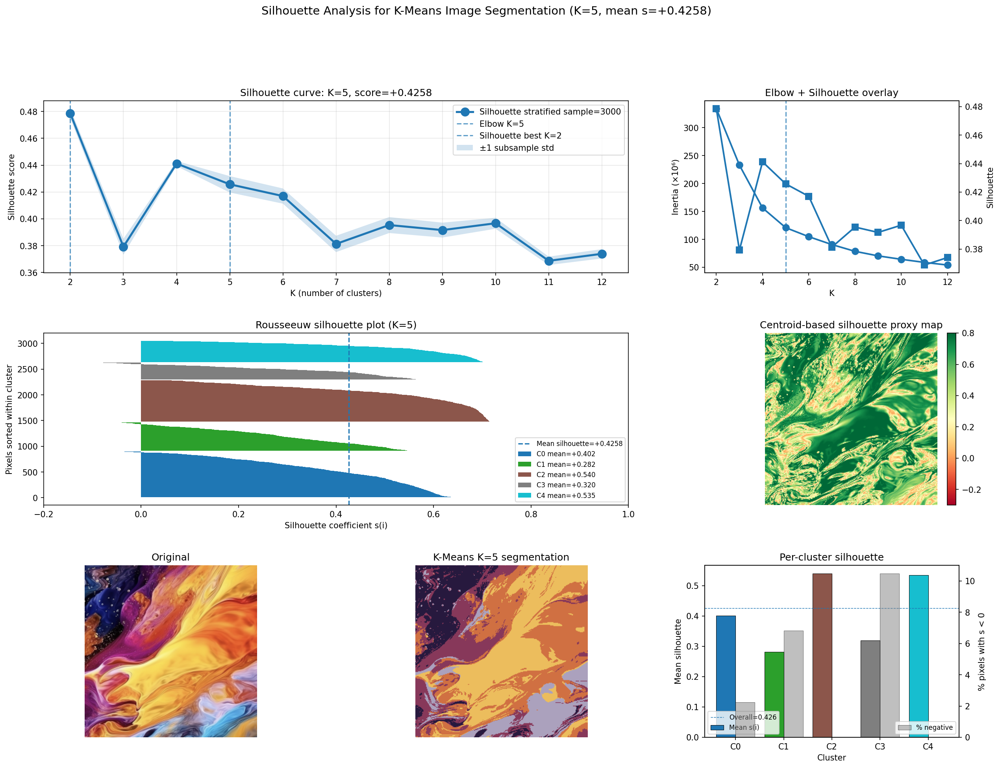

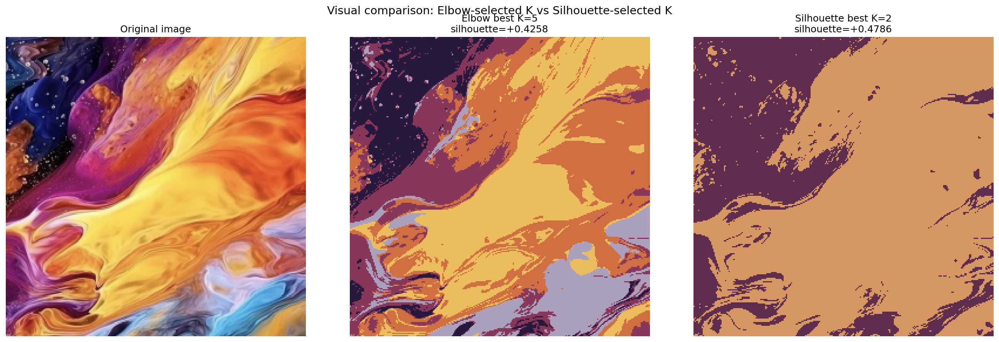

In [43]:
_phase_original_print = print
_phase_original_show = plt.show
try:
    print = lambda *args, **kwargs: None
    plt.show = lambda *args, **kwargs: None
    t_silhouette_start = time.time()

    print("=" * 60)
    print("Silhouette score across K")
    print("=" * 60)

    def stratified_sample_indices(labels, max_samples=3000, random_state=42):
        rng = np.random.RandomState(random_state)
        labels = np.asarray(labels)
        unique_labels = np.unique(labels)

        selected = []

        # Guarantee at least one sample per cluster
        for c in unique_labels:
            idx_c = np.where(labels == c)[0]
            if len(idx_c) > 0:
                selected.append(rng.choice(idx_c, size=1, replace=False))

        selected = np.concatenate(selected) if len(selected) > 0 else np.array([], dtype=int)

        remaining_budget = max_samples - len(selected)

        if remaining_budget > 0:
            all_indices = np.arange(len(labels))
            remaining_pool = np.setdiff1d(all_indices, selected, assume_unique=False)

            if len(remaining_pool) > 0:
                extra_size = min(remaining_budget, len(remaining_pool))
                extra = rng.choice(remaining_pool, size=extra_size, replace=False)
                selected = np.concatenate([selected, extra])

        rng.shuffle(selected)
        return selected.astype(int)

    SAMPLE_SIZE = min(3000, N_PIXELS)
    k_range = list(range(2, 13))

    silhouette_scores = []
    silhouette_times = []
    silhouette_subsample_stds = []
    silhouette_inertias = []

    print(f"Using stratified subsample of up to {SAMPLE_SIZE:,} pixels (out of {N_PIXELS:,})")
    print(
        f"\n{'K':>3s}  {'inertia':>14s}  {'silhouette':>10s}  "
        f"{'subsample_std':>13s}  {'time (ms)':>10s}"
    )
    print("-" * 75)

    for k in k_range:
        km_k = KMeans(
            n_clusters=k,
            n_init=10,
            max_iter=MAX_ITER,
            random_state=RANDOM_SEED,
            algorithm="lloyd",
        )

        km_k.fit(pixel_matrix_f32)

        labels_k = km_k.labels_
        inertia_k = float(km_k.inertia_)
        silhouette_inertias.append(inertia_k)

        sample_indices = stratified_sample_indices(
            labels_k,
            max_samples=SAMPLE_SIZE,
            random_state=RANDOM_SEED,
        )

        X_sample_k = pixel_matrix_f32[sample_indices]
        y_sample_k = labels_k[sample_indices]

        t0 = time.time()

        if len(np.unique(y_sample_k)) < 2:
            s = np.nan
        else:
            s = silhouette_score(X_sample_k, y_sample_k)

        t = time.time() - t0

        s_repeats = []

        for j in range(3):
            sample_indices_j = stratified_sample_indices(
                labels_k,
                max_samples=SAMPLE_SIZE,
                random_state=RANDOM_SEED + j,
            )

            X_sample_j = pixel_matrix_f32[sample_indices_j]
            y_sample_j = labels_k[sample_indices_j]

            if len(np.unique(y_sample_j)) >= 2:
                s_j = silhouette_score(X_sample_j, y_sample_j)
                s_repeats.append(float(s_j))

        if len(s_repeats) > 0:
            std_s = float(np.std(s_repeats))
        else:
            std_s = np.nan

        silhouette_scores.append(float(s))
        silhouette_times.append(float(t))
        silhouette_subsample_stds.append(std_s)

        print(
            f"{k:>3d}  {inertia_k:>14,.2f}  {s:>+10.4f}  "
            f"{std_s:>13.4f}  {t*1000:>10.1f}"
        )


    silhouette_scores = np.array(silhouette_scores, dtype=float)
    silhouette_times = np.array(silhouette_times, dtype=float)
    silhouette_subsample_stds = np.array(silhouette_subsample_stds, dtype=float)
    silhouette_inertias = np.array(silhouette_inertias, dtype=float)

    valid_sil_mask = ~np.isnan(silhouette_scores)

    if valid_sil_mask.any():
        best_idx = int(np.nanargmax(silhouette_scores))
        k_silhouette_best = int(k_range[best_idx])
    else:
        k_silhouette_best = None

    print("\n--- Cross-validation ---")
    print(f"  Elbow K                      : {K_FINAL}")
    print(f"  Silhouette best K             : {k_silhouette_best}")

    sil_at_elbow = float(silhouette_scores[K_FINAL - 2])
    sil_at_silhouette_best = float(silhouette_scores[k_silhouette_best - 2])

    print(f"  Silhouette at K={K_FINAL}      : {sil_at_elbow:+.4f}")
    print(f"  Silhouette best               : {sil_at_silhouette_best:+.4f}")

    sil_diff = sil_at_silhouette_best - sil_at_elbow
    print(f"  Difference                    : {sil_diff:+.4f}")

    agreement = k_silhouette_best == K_FINAL

    if agreement:
        print(f"  [CHECK 1] Elbow K and Silhouette best K agree at K={K_FINAL}  ✓")
    else:
        print("  ⚠️ Elbow K and Silhouette best K disagree.")
        print("  This is acceptable in image segmentation:")
        print("    - Elbow Method focuses on compactness / inertia.")
        print("    - Silhouette focuses on cluster separation.")
        print("    - Final K should balance metric quality and visual interpretability.")

    assert sil_at_elbow >= 0.3, (
        f"K={K_FINAL} silhouette too low: {sil_at_elbow:.4f}"
    )

    print(f"  [CHECK 2] Silhouette at K={K_FINAL} ≥ 0.3  ✓")

    assert ((silhouette_scores[valid_sil_mask] >= -1.0) & (silhouette_scores[valid_sil_mask] <= 1.0)).all()
    print("  [CHECK 3] All silhouette scores are in valid range [-1, +1]  ✓")

    if not agreement:
        assert sil_at_elbow >= 0.3, (
            f"K={K_FINAL} silhouette too low: {sil_at_elbow:.4f}"
        )
        print(f"  [CHECK 4] Elbow K={K_FINAL} remains acceptable with silhouette ≥ 0.3  ✓")

    print(f"\n{'='*60}")
    print("Per-cluster silhouette (Rousseeuw plot)")
    print(f"{'='*60}")

    km_final_sk = KMeans(
        n_clusters=K_FINAL,
        n_init=10,
        max_iter=MAX_ITER,
        random_state=RANDOM_SEED,
        algorithm="lloyd",
    )

    km_final_sk.fit(pixel_matrix_f32)

    labels_final_sk = km_final_sk.labels_
    centers_final = km_final_sk.cluster_centers_.astype(np.float32)

    sample_indices = stratified_sample_indices(
        labels_final_sk,
        max_samples=SAMPLE_SIZE,
        random_state=RANDOM_SEED,
    )

    X_sample = pixel_matrix_f32[sample_indices]
    labels_sample = labels_final_sk[sample_indices]

    t0 = time.time()

    if len(np.unique(labels_sample)) < 2:
        raise ValueError("Silhouette sample contains fewer than 2 clusters. Increase SAMPLE_SIZE.")

    sil_samples = silhouette_samples(X_sample, labels_sample)

    t_sil_samples = time.time() - t0

    print(f"silhouette_samples computed in {t_sil_samples*1000:.1f} ms (stratified subsample)")

    print(
        f"\n{'C':>3s}  {'mean':>10s}  {'min':>10s}  "
        f"{'max':>10s}  {'frac_neg':>10s}  {'n_samples':>9s}"
    )
    print("-" * 60)

    cluster_sil_stats = []

    for c in range(K_FINAL):
        mask = labels_sample == c
        s_c = sil_samples[mask]

        if len(s_c) == 0:
            mean_s = np.nan
            min_s = np.nan
            max_s = np.nan
            frac_neg = np.nan
            n = 0
        else:
            mean_s = float(s_c.mean())
            min_s = float(s_c.min())
            max_s = float(s_c.max())
            frac_neg = float((s_c < 0).mean())
            n = int(mask.sum())

        cluster_sil_stats.append(
            {
                "cluster": int(c),
                "mean": mean_s,
                "min": min_s,
                "max": max_s,
                "frac_negative": frac_neg,
                "n_samples": n,
            }
        )

        print(
            f"{c:>3d}  {mean_s:>+10.4f}  {min_s:>+10.4f}  {max_s:>+10.4f}  "
            f"{frac_neg*100:>9.2f}%  {n:>9d}"
        )


    mean_sil_all = float(np.nanmean(sil_samples))
    valid_cluster_means = [
        s["mean"] for s in cluster_sil_stats
        if not np.isnan(s["mean"])
    ]

    min_sil_cluster_mean = float(min(valid_cluster_means))

    print(f"\n  Overall mean silhouette   : {mean_sil_all:+.4f}")
    print(f"  Weakest cluster mean      : {min_sil_cluster_mean:+.4f}")

    assert mean_sil_all > 0.0, (
        f"overall silhouette should be positive: {mean_sil_all}"
    )

    print("\n[CHECK 5] Overall silhouette > 0  ✓")

    assert min_sil_cluster_mean > -0.2, (
        f"weakest cluster too negative: {min_sil_cluster_mean}"
    )

    print("[CHECK 6] Weakest cluster mean > -0.2  ✓")
    print(f"\n{'='*60}")
    print("Silhouette 2D map (centroid-based per-pixel proxy)")
    print(f"{'='*60}")
    t0 = time.time()

    dist_to_centers = np.sqrt(
        ((pixel_matrix_f32[:, None, :] - centers_final[None, :, :]) ** 2).sum(axis=2)
    )

    a_dist = dist_to_centers[np.arange(N_PIXELS), labels_final_sk]

    dist_to_other = dist_to_centers.copy()
    dist_to_other[np.arange(N_PIXELS), labels_final_sk] = np.inf
    b_dist = dist_to_other.min(axis=1)

    denominator = np.maximum(a_dist, b_dist)

    sil_per_pixel = np.zeros(N_PIXELS, dtype=np.float32)

    valid_mask = denominator > 0

    sil_per_pixel[valid_mask] = (
        (b_dist[valid_mask] - a_dist[valid_mask]) / denominator[valid_mask]
    ).astype(np.float32)

    sil_per_pixel = np.clip(sil_per_pixel, -1.0, 1.0)

    t_sil_per_pixel = time.time() - t0

    print(f"Centroid-based per-pixel silhouette proxy computed in {t_sil_per_pixel*1000:.1f} ms")
    print(f"  Global mean proxy : {sil_per_pixel.mean():+.4f}")

    print(
        f"  Pixels with s < 0   : {int((sil_per_pixel < 0).sum()):,}  "
        f"({(sil_per_pixel < 0).mean()*100:.2f}%)"
    )

    print(
        f"  Pixels with s > 0.5 : {int((sil_per_pixel > 0.5).sum()):,}  "
        f"({(sil_per_pixel > 0.5).mean()*100:.2f}%)"
    )

    sil_2d = sil_per_pixel.reshape(H_RESIZED, W_RESIZED)

    assert (sil_2d.min() >= -1.0) and (sil_2d.max() <= 1.0)
    print("\n[CHECK 7] Silhouette 2D proxy map range [-1, +1]  ✓")

    fig = plt.figure(figsize=(20, 14))
    gs = fig.add_gridspec(3, 3, hspace=0.35, wspace=0.3)
    ax_main = fig.add_subplot(gs[0, :2])

    ax_main.plot(
        k_range,
        silhouette_scores,
        "o-",
        linewidth=2.5,
        markersize=10,
        label=f"Silhouette stratified sample={SAMPLE_SIZE}",
    )

    ax_main.axvline(
        K_FINAL,
        linestyle="--",
        alpha=0.7,
        label=f"Elbow K={K_FINAL}",
    )

    if k_silhouette_best is not None:
        ax_main.axvline(
            k_silhouette_best,
            linestyle="--",
            alpha=0.7,
            label=f"Silhouette best K={k_silhouette_best}",
        )

    ax_main.fill_between(
        k_range,
        silhouette_scores - silhouette_subsample_stds,
        silhouette_scores + silhouette_subsample_stds,
        alpha=0.2,
        label="±1 subsample std",
    )

    ax_main.set_xlabel("K (number of clusters)")
    ax_main.set_ylabel("Silhouette score")
    ax_main.set_title(
        f"Silhouette curve: K={K_FINAL}, score={sil_at_elbow:+.4f}"
    )
    ax_main.legend()
    ax_main.grid(True, alpha=0.3)
    ax_main.set_xticks(k_range)


    ax_elbow = fig.add_subplot(gs[0, 2])
    ax_elbow2 = ax_elbow.twinx()

    ax_elbow.plot(
        k_range,
        silhouette_inertias / 1e6,
        "o-",
        linewidth=2,
        markersize=8,
        label="Inertia",
    )

    ax_elbow.set_xlabel("K")
    ax_elbow.set_ylabel("Inertia (×10⁶)")
    ax_elbow.tick_params(axis="y")

    ax_elbow2.plot(
        k_range,
        silhouette_scores,
        "s-",
        linewidth=2,
        markersize=8,
        label="Silhouette",
    )

    ax_elbow2.set_ylabel("Silhouette")
    ax_elbow2.tick_params(axis="y")

    ax_elbow.axvline(K_FINAL, linestyle="--", alpha=0.7)
    ax_elbow.set_title("Elbow + Silhouette overlay")

    ax_rouss = fig.add_subplot(gs[1, :2])

    y_lower = 10
    colors_r = plt.cm.tab10(np.linspace(0, 1, K_FINAL))

    for c in range(K_FINAL):
        s_c = sil_samples[labels_sample == c]
        s_c_sorted = np.sort(s_c)[::-1]
        n = len(s_c_sorted)

        if n == 0:
            continue

        ax_rouss.barh(
            range(y_lower, y_lower + n),
            s_c_sorted,
            height=1.0,
            edgecolor="none",
            color=colors_r[c],
            label=f"C{c} mean={cluster_sil_stats[c]['mean']:+.3f}",
        )

        y_lower += n + 10

    ax_rouss.axvline(
        mean_sil_all,
        linestyle="--",
        label=f"Mean silhouette={mean_sil_all:+.4f}",
    )

    ax_rouss.set_xlabel("Silhouette coefficient s(i)")
    ax_rouss.set_ylabel("Pixels sorted within cluster")
    ax_rouss.set_title(f"Rousseeuw silhouette plot (K={K_FINAL})")
    ax_rouss.legend(loc="lower right", fontsize=8)
    ax_rouss.set_xlim(-0.2, 1.0)

    ax_sil_map = fig.add_subplot(gs[1, 2])

    im = ax_sil_map.imshow(
        sil_2d,
        cmap="RdYlGn",
        vmin=-0.3,
        vmax=0.8,
    )

    ax_sil_map.set_title("Centroid-based silhouette proxy map")
    ax_sil_map.axis("off")

    plt.colorbar(im, ax=ax_sil_map, fraction=0.046, pad=0.04)

    ax_orig = fig.add_subplot(gs[2, 0])

    ax_orig.imshow(img_resized)
    ax_orig.set_title("Original")
    ax_orig.axis("off")

    ax_seg = fig.add_subplot(gs[2, 1])

    ax_seg.imshow(img_segmented_final)
    ax_seg.set_title(f"K-Means K={K_FINAL} segmentation")
    ax_seg.axis("off")

    ax_per_cluster = fig.add_subplot(gs[2, 2])

    cluster_ids = [s["cluster"] for s in cluster_sil_stats]
    cluster_means = [s["mean"] for s in cluster_sil_stats]
    cluster_fracs = [s["frac_negative"] * 100 for s in cluster_sil_stats]

    x_pos = np.arange(K_FINAL)
    width = 0.4

    ax_per_cluster.bar(
        x_pos - width / 2,
        cluster_means,
        width,
        color=colors_r,
        edgecolor="black",
        linewidth=0.5,
        label="Mean s(i)",
    )

    ax_per_cluster2 = ax_per_cluster.twinx()

    ax_per_cluster2.bar(
        x_pos + width / 2,
        cluster_fracs,
        width,
        color="gray",
        alpha=0.5,
        edgecolor="black",
        linewidth=0.5,
        label="% negative",
    )

    ax_per_cluster.set_xticks(x_pos)
    ax_per_cluster.set_xticklabels([f"C{c}" for c in cluster_ids])
    ax_per_cluster.set_xlabel("Cluster")
    ax_per_cluster.set_ylabel("Mean silhouette")
    ax_per_cluster2.set_ylabel("% pixels with s < 0")

    ax_per_cluster.set_title("Per-cluster silhouette")
    ax_per_cluster.axhline(0, linewidth=0.5)
    ax_per_cluster.axhline(
        mean_sil_all,
        linestyle="--",
        linewidth=0.7,
        label=f"Overall={mean_sil_all:.3f}",
    )

    ax_per_cluster.legend(loc="lower left", fontsize=8)
    ax_per_cluster2.legend(loc="lower right", fontsize=8)

    plt.suptitle(
        f"Silhouette Analysis for K-Means Image Segmentation "
        f"(K={K_FINAL}, mean s={mean_sil_all:+.4f})",
        fontsize=14,
        y=0.995,
    )

    silhouette_analysis_path = os.path.join(output_dir, "silhouette_analysis.png")

    plt.savefig(silhouette_analysis_path, bbox_inches="tight")
    plt.show()
    plt.close()

    print(f"\nVisualization saved: {silhouette_analysis_path}")
    fig, ax = plt.subplots(1, 2, figsize=(14, 6))

    ax[0].imshow(img_resized)
    ax[0].set_title("Original")
    ax[0].axis("off")

    im1 = ax[1].imshow(
        sil_2d,
        cmap="RdYlGn",
        vmin=-0.3,
        vmax=0.8,
    )

    ax[1].set_title(
        f"Centroid-based silhouette proxy map\n"
        f"mean proxy={sil_per_pixel.mean():+.4f}"
    )
    ax[1].axis("off")

    plt.colorbar(im1, ax=ax[1], fraction=0.046, pad=0.04)

    plt.suptitle("Silhouette confidence map", fontsize=13)

    silhouette_map_path = os.path.join(output_dir, "silhouette_map.png")

    plt.savefig(silhouette_map_path, bbox_inches="tight")
    plt.show()
    plt.close()

    print(f"Visualization saved: {silhouette_map_path}")

    print("\nGenerating Elbow-vs-Silhouette segmentation comparison...")

    if k_silhouette_best is None:
        raise ValueError("Cannot draw Silhouette-best segmentation because k_silhouette_best is None.")

    km_silhouette_best = KMeans(
        n_clusters=int(k_silhouette_best),
        n_init=10,
        max_iter=MAX_ITER,
        random_state=RANDOM_SEED,
        algorithm="lloyd",
    )

    km_silhouette_best.fit(pixel_matrix_f32)

    labels_silhouette_best = km_silhouette_best.labels_
    centers_silhouette_best = np.clip(
        km_silhouette_best.cluster_centers_,
        0,
        255,
    ).astype(np.uint8)

    img_segmented_silhouette_best = centers_silhouette_best[labels_silhouette_best].reshape(
        H_RESIZED,
        W_RESIZED,
        3,
    )

    fig, ax = plt.subplots(1, 3, figsize=(18, 6))

    ax[0].imshow(img_resized)
    ax[0].set_title("Original image")
    ax[0].axis("off")

    ax[1].imshow(img_segmented_final)
    ax[1].set_title(
        f"Elbow best K={K_FINAL}\n"
        f"silhouette={sil_at_elbow:+.4f}"
    )
    ax[1].axis("off")

    ax[2].imshow(img_segmented_silhouette_best)
    ax[2].set_title(
        f"Silhouette best K={k_silhouette_best}\n"
        f"silhouette={sil_at_silhouette_best:+.4f}"
    )
    ax[2].axis("off")

    plt.suptitle(
        "Visual comparison: Elbow-selected K vs Silhouette-selected K",
        fontsize=14,
    )
    plt.tight_layout()

    silhouette_vs_elbow_path = os.path.join(
        output_dir,
        "silhouette_vs_elbow_segmentation.png",
    )

    plt.savefig(silhouette_vs_elbow_path, bbox_inches="tight")
    plt.show()
    plt.close()

    print(f"Visualization saved: {silhouette_vs_elbow_path}")
    print(
        f"Comparison summary: Elbow K={K_FINAL}, "
        f"Silhouette best K={k_silhouette_best}, "
        f"score difference={sil_diff:+.4f}"
    )

    silhouette_results = {
        "k_range": [int(k) for k in k_range],
        "silhouette_scores": [float(s) for s in silhouette_scores],
        "silhouette_subsample_stds": [float(s) for s in silhouette_subsample_stds],
        "silhouette_times_ms": [float(t * 1000) for t in silhouette_times],
        "inertias": [float(v) for v in silhouette_inertias],
        "best_k_by_silhouette": int(k_silhouette_best),
        "elbow_k": int(K_FINAL),
        "agreement": bool(agreement),
        "sample_size": int(SAMPLE_SIZE),
        "overall_mean_silhouette": float(mean_sil_all),
        "overall_mean_centroid_silhouette_proxy": float(sil_per_pixel.mean()),
        "cluster_stats": cluster_sil_stats,
        "pixels_negative_silhouette_proxy": int((sil_per_pixel < 0).sum()),
        "pixels_high_silhouette_proxy": int((sil_per_pixel > 0.5).sum()),
        "silhouette_vs_elbow_segmentation_path": silhouette_vs_elbow_path,
        "tested_at": datetime.now().isoformat(timespec="seconds"),
    }

    silhouette_json_path = os.path.join(output_dir, "silhouette_results.json")

    with open(silhouette_json_path, "w") as f:
        json_module.dump(silhouette_results, f, indent=2)

    print(f"\nResults JSON saved: {silhouette_json_path}")

    t_silhouette = time.time() - t_silhouette_start
    total_pipeline = time.time() - PIPELINE_START_TIME

    print(f"\n{'='*60}")
    print(f"Silhouette analysis wall-time : {t_silhouette*1000:.1f} ms ({t_silhouette:.2f} s)")
    print(f"Total pipeline (P2->13)      : {total_pipeline:.2f} s")
    print(f"{'='*60}")

    quality_label = (
        "GOOD" if mean_sil_all > 0.3
        else "MODERATE" if mean_sil_all > 0.1
        else "WEAK"
    )

    cluster_label = (
        "STRONG" if min_sil_cluster_mean > 0.2
        else "OK" if min_sil_cluster_mean > 0
        else "WEAK"
    )

    print("\n*** Silhouette Analysis complete ***")
    print(f"  - Elbow K                  : {K_FINAL}")
    print(f"  - Best K by Silhouette      : {k_silhouette_best}")
    print(f"  - Agreement                 : {agreement}")
    print(f"  - Mean silhouette           : {mean_sil_all:+.4f} ({quality_label})")
    print(f"  - Weakest cluster mean      : {min_sil_cluster_mean:+.4f} ({cluster_label})")
    print(f"  - Centroid-proxy map mean   : {sil_per_pixel.mean():+.4f}")

    if not agreement:
        print("\nInterpretation:")
        print(
            f"  Elbow selects K={K_FINAL}, while Silhouette selects K={k_silhouette_best}. "
            f"This disagreement is acceptable because the two methods optimize different goals. "
            f"Elbow focuses on compactness and simplicity, while Silhouette focuses on separation. "
            f"For image segmentation, final K should be selected based on both metrics and visual quality."
        )
finally:
    print = _phase_original_print
    plt.show = _phase_original_show


from IPython.display import Image as IPImage

silhouette_rows = []
for i, k in enumerate(k_range):
    silhouette_rows.append((
        k,
        f"{silhouette_inertias[i]:,.2f}",
        f"{silhouette_scores[i]:+.4f}",
        f"{silhouette_subsample_stds[i]:.4f}",
        f"{silhouette_times[i]*1000:.1f}",
    ))
phase13_k_html = render_phase_table_wrapped(
    "Phase 13 - Silhouette Score by K",
    silhouette_rows,
    ["K", "inertia", "silhouette", "sample std", "time ms"],
    max_width="820px",
)
display(HTML(phase13_k_html))

phase13_summary_rows = [
    (0, "Sample size", f"{SAMPLE_SIZE:,} / {N_PIXELS:,}"),
    (1, "K range", f"{min(k_range)}..{max(k_range)}"),
    (2, "Elbow K", K_FINAL),
    (3, "Silhouette best K", k_silhouette_best),
    (4, "Agreement", agreement),
    (5, f"Silhouette at K={K_FINAL}", f"{sil_at_elbow:+.4f}"),
    (6, "Best silhouette", f"{sil_at_silhouette_best:+.4f}"),
    (7, "Overall mean silhouette", f"{mean_sil_all:+.4f}"),
]
phase13_summary_html = render_phase_table_wrapped(
    "Silhouette Summary",
    phase13_summary_rows,
    ["#", "item", "value"],
    max_width="760px",
)
display(HTML(phase13_summary_html))

cluster_sil_rows = []
for s in cluster_sil_stats:
    cluster_sil_rows.append((
        s["cluster"],
        f"{s['mean']:+.4f}",
        f"{s['min']:+.4f}",
        f"{s['max']:+.4f}",
        f"{s['frac_negative']*100:.2f}%",
        int(s["n_samples"]),
    ))
phase13_cluster_html = render_phase_table_wrapped(
    "Per-Cluster Silhouette",
    cluster_sil_rows,
    ["cluster", "mean", "min", "max", "negative", "samples"],
    max_width="820px",
)
display(HTML(phase13_cluster_html))

phase13_proxy_rows = [
    (0, "Centroid proxy mean", f"{sil_per_pixel.mean():+.4f}"),
    (1, "Proxy min/max", f"{sil_per_pixel.min():+.4f}..{sil_per_pixel.max():+.4f}"),
    (2, "Pixels with s < 0", f"{int((sil_per_pixel < 0).sum()):,} ({(sil_per_pixel < 0).mean()*100:.2f}%)"),
    (3, "Pixels with s > 0.5", f"{int((sil_per_pixel > 0.5).sum()):,} ({(sil_per_pixel > 0.5).mean()*100:.2f}%)"),
    (4, "Map output", silhouette_map_path),
]
phase13_proxy_html = render_phase_table_wrapped(
    "Silhouette Proxy Map",
    phase13_proxy_rows,
    ["#", "item", "value"],
    max_width="820px",
)
display(HTML(phase13_proxy_html))

phase13_artifact_rows = [
    (0, "Analysis output", silhouette_analysis_path),
    (1, "Map output", silhouette_map_path),
    (2, "Elbow-vs-silhouette output", silhouette_vs_elbow_path),
    (3, "JSON output", silhouette_json_path),
    (4, "Silhouette range", "pass"),
    (5, f"K={K_FINAL} silhouette >= 0.3", "pass"),
]
phase13_artifact_html = render_phase_table_wrapped(
    "Silhouette Checks and Artifacts",
    phase13_artifact_rows,
    ["#", "check", "value"],
    max_width="820px",
)
display(HTML(phase13_artifact_html))

display(IPImage(filename=silhouette_analysis_path))
display(IPImage(filename=silhouette_vs_elbow_path))
